# <img style="float: left; padding-right: 10px; width: 45px" src="https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/iacs.png"> CS109B Group 16 Project

# What Makes An Asset Class Attractive

**Harvard University**<br/>
**Spring 2022**<br/>
**Team Members**: Yang Liu, Ellen Sun, Hayden Mckee, Qi Chu<br/>
**Youtube Link for presentation**: https://youtu.be/3yu6FrawIBQ
<br/>

## Project Objectives

The objective of this project is to identify features of attractive asset classes, from methods like visual interpretation, structured statistical analysis and time series forecasting. We aim to predict the **forward 1 week return** of each individual asset class, such as equities, bonds and commodities, on the secondary market. To that end, our general process ended up looking like:
1. First, we use a simple ***linear regression*** model with PCA for baseline predictions, so that we know what is possible with very naive estimators.
2. Then, we utilize a simple ***Feed-Forward Neural Network*** to get a more advanced baseline, as well as learn what issues we might encounter when attempting this task with a basic neural network framework, which we can then try to fix with more complicated models later.
3. After this attempt, we were unsatisfied with our performance, so we used a technique described in some recent academic papers to attempt to capture the visual graph-goes-up-or-down attribute of traditional manual prediction by converting data into charts and feeding these through a ***Convolutional Neural Network***.
4. Then, we used several ***Long Short-Term Memory*** networks to additionally get a feel for the possibilities with traditional RNN time series prediction.
5. Finally, we use the results of these models to formulate several ***multi-asset trading strategies*** by longing/shorting the predicted top/bottom asset classes

## Project Background

In the US secondary market, investors trade many different asset classes on a daily basis, such as ***equity, bonds, commodities, and foreign assets***, so that they can gain access to different market exposures. Traders and portfolio managers make predictions and bets on these asset classes constantly, based on their analysis of ***macro trends, finance fundamentals, technical analysis, and sometimes even simple visuals***.

The common visual and technical tools used include ***moving averages of price, candle charts (which measure possible price movement), long term momentum, short term reversal, relative strength indicators, moving average convergence/divergence*** and more. However, these tools work to varying degrees for different asset classes at different time periods. This is inherently risky for the analyst, who could accidentally cherry pick a strategy that works well on historical data, but does not generalize well to the future. Therefore, a systematic machine learning tool could dramatically assist humans in making ***technical and visual*** decisions in a more timely and efficient manner.

In this project, we aim to build a neural network capable of extracting the essential visual and technical features from historical data and making systematic predictions for future prices. The wish list feature of neural networks would be a combination of ***feature extraction and time series/context sensitivity***. 



## **Project Tasks and Considerations**

This project proposes to use sliding intervals of past return and price data for various asset classes to predict the upcoming weekly return of those assets. Based on our research, our combined experience with finance data, and the statistical methods we've learned in CS109A+B, here are some of our key considerations entering into the project:

**1. Input structure, transformation and preprocessing**

With neural networks, getting your input data into the right shape is half of the battle. To that end, we had to sort out the following subjects before we could get started in earnest:

- **Lookback Window**

    For several RNN frameworks, the network operates on or prefers a set window of time to use for prediction. This closely mirrors manual predictions, where analysts will compare recent results to make their best guesses. For this reason, we decided to test both 21 day and 63 day windows, which are commonly used in finance to capture as much relevant informaiton as possible.

- **Image Conversion**

    Our Convolutional Neural Network implementation requires us to convert the raw time-series data to graphs, and in *Wang and Oates (2015)*, two methods for this are proposed:

    - **Graiman Angular Fields (GAF)**. 
    
    In short, this methodology tries to map normalized time series into polar   coordinates, then represents those graphically. This displays the relationship between every data point and every other data point cyclically.

    - **Markov Transition Fields (MTF)**. 
    
    Advantage of this method is that it extracts positional information of data points and conclude how related to two data points are in the time series. 


**2	Response Variable Structure**

Between a classification problem and regression problem, we lean toward using ***regression i.e. continuous labels at this point***. This is because the nature of this project is ***forecasting returns*** for trading purposes, and having a continuous estimation is more convenient to form backtest strategies. More specifically, a classification approach could place assets into "buy" or "sell" buckets, but a regression approach allows us to have more confidence in our trades - so we can prefer the assets which are most likely to provide returns. 

    2.1 Predicting forward 1 week return
    2.2 Winsorized at 95% and 5% percentiles
    
**3 Training and testing split**

   Generalizing well to future data is critical for this task, since predicting things which have already happened is worthless without being able to accurately predict for the future, so splitting our data for validation and testing purposes was key. However, the sequential nature of time series data means that we can't simply randomly select weeks for a train/test split, so we instead picked a split date - before that date is training, after that date is testing. As such, our data structure looks as follows:

    3.1 Full Data:	53 years of daily pricing data from 1970 to 2022
    3.2 Training Data:	first 48 years from 1970 to 2007
    3.3 Testing Data:	last 15 year to test the model from 2008-2022.

**4	Model Evaluation**

Since we are treating this as a ***regression problem***, naturally we want to evaluate using common regression metrics such as MSE. Additionally, the symmetric nature of MSE (punishing over and underestimates indiscriminately) makes it apt for this project - overshooting and buying a bad asset is just as bad as underpredicting and shorting an asset that doesn't end up decreasing in value.

More importantly, since the nature of the project is to ***predict future returns***, we will implement a ***backtest strategy***, essentially test-driving our developed strategy, to observe the ***performance of the long-short portfolios*** formed from our predicted results.

<a id="contents"></a>

## Notebook Contents

- [**Set Up Parameter**](#set_up)
    - [import package](#import_package)
    - [analysis parameter](#analysis_parameter)
    - [input & output](#input_output)
    - [asset class parameter](#asset_parameter)
- [**Read Input Data**](#read_data)
    - [read raw data](#raw_data)
    - [scrub data](#scrub_data)
    - [align predictors with response](#align_data)
- [**Exploratory Data Analysis**](#eda)
    - [data coverage](#data_coverage)
    - [distribution of response variable](#response_distribution)
    - [correlation among predictors](#predictor_correlation)
    - [PCA analysis of predictors](#predictor_pca)    
    - [correlation of PCA with response](#pca_response)   
    - [convert data to image](#data_to_image)   
- [**Baseline Model**](#baseline_model)
    - [simple linear regression](#linear_regression)
    - [FFNN](#ffnn)    
- [**Deep NN Model**](#deep_nn)
    - [CNN](#cnn)
    - [LSTM](#lstm)
    - [LSTM based on price](#lstm_return)
    - [LSTM based on C-O-H-L (Close/Open/High/Low) + Return](#lstm_cohl_return)
    - [Bi-LSTM with 1-day time step](#bi_lstm_1)
    - [Bi-LSTM with 7-day time step](#bi_lstm_7)
    - [Bi-LSTM with 1/3/7/21-day time step](#bi_lstm_multi)
- [**Model Comparison**](#model_comp)
    - [model comparison by asset](#model_comp_asset)
    - [model comparison average](#model_comp_average)
- [**Backtest**](#backtest)
    - [creat long short portfolio](#long_short)
    - [performance summary](#perf_summary)
    - [cumulative performance](#perf_cum)
    - [rolling performance](#perf_rolling)

# Setup, Preprocessing <div id='set_up'>

## import packages <div id='import_package'>

In [ ]:
# import open source package
import os
import sys
print(sys.executable)
import pandas as pd
from pandas.tseries.holiday import USFederalHolidayCalendar
from pandas.tseries.offsets import CustomBusinessDay
import numpy as np
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style("white")
import datetime as dt
import time
from data_processing_func import *
from prediction_model_func import *
import gc
import pickle
# import tia.bbg.datamgr as dm
import warnings
warnings.filterwarnings('ignore')
gc.enable()

import tensorflow as tf
import tensorflow_addons as tfa
import tensorflow_datasets as tfds
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Activation, BatchNormalization
from tensorflow.keras.layers import Conv2D, Dense, Dropout 
from tensorflow.keras.layers import Flatten, Input, MaxPooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import TimeDistributed
from keras.layers import Bidirectional


AUTOTUNE = tf.data.AUTOTUNE
tf.get_logger().setLevel('INFO')
tf.random.set_seed(2266)

import shutil
#shutil.rmtree('../output/models')

import backtest202e as bt
from backtest202e.utils.utils import*
from backtest202e.utils.ranking import*
from backtest202e.strategy import Strategy
from backtest202e.backtest import Backtest
import importlib

# utility function to refresh package
def refresh(name):
    importlib.reload(name)

%load_ext autoreload
%autoreload 2

/usr/bin/python3


## Definitions of Constants <div id='analysis_parameter'>

In [ ]:
# DEFINE START AND END DATE, AND TRAIN/TEST SPLIT DATE
US_BUSINESS_DAY = CustomBusinessDay(calendar=USFederalHolidayCalendar())
date_end = dt.date.today() - 1 * US_BUSINESS_DAY
date_end = dt.datetime(2022, 4, 12)
date_start = dt.datetime(1970, 1, 2)
date_split = dt.datetime(2007, 12, 31)
print('Start date: \t%s' % (date_start.strftime('%Y-%m-%d')))
print('End date: \t%s' % (date_end.strftime('%Y-%m-%d')))

vrsn = '3'

Start date: 	1970-01-02
End date: 	2022-04-12


## Create Input/Output File Paths <div id='input_output'>

In [ ]:
dir_wkdir = os.path.dirname(os.path.abspath('.'))

# input directory
dir_in = os.path.join(dir_wkdir, 'input')

# output directory
dir_out = os.path.join(dir_wkdir, 'output')

pkl_raw = os.path.join(dir_in, 'raw %s v%s.pkl' % (date_end.strftime('%Y%m%d'), vrsn))
pkl_daily = os.path.join(dir_in, 'daily %s v%s.pkl' % (date_end.strftime('%Y%m%d'), vrsn))
pkl_align = os.path.join(dir_in, 'align %s v%s.pkl' % (date_end.strftime('%Y%m%d'), vrsn))
pkl_image = os.path.join(dir_in, 'image %s v%s.pkl' % (date_end.strftime('%Y%m%d'), vrsn))
pkl_model = os.path.join(dir_out, 'model %s v%s.pkl' % (date_end.strftime('%Y%m%d'), vrsn))
csv_summary = os.path.join(dir_out, 'summary %s v%s.csv' % (date_end.strftime('%Y%m%d'), vrsn))

# make directory
ls_mkdir = [dir_in, dir_out]
for directory in ls_mkdir:
    if not os.path.exists(directory):
        os.mkdir(directory)

## Create and Categorize Lists of Asset Classes <div id='asset_parameter'>

In [ ]:
# asset class underlying to use - index vs etf
asset_type = 'index'

# asset class map     
dc_ticker = {'STB': {'index': 'LD04TRUU INDEX', 'ETF': 'BSV US EQUITY',  'type': 'fi',  'label': 'US Short Duration Bond'},
             'BND': {'index': 'LBUSTRUU INDEX', 'ETF': 'AGG US EQUITY',  'type': 'fi',  'label': 'US Intermediate Agg Bond'},
             'LTB': {'index': 'IDCOT20T INDEX', 'ETF': 'TLT US EQUITY',  'type': 'fi',  'label': 'US Long Duration Bond'},
             'TIP': {'index': 'LBUTTRUU INDEX', 'ETF': 'TIP US EQUITY',  'type': 'fi',  'label': 'US Inflation Protected Bond'},
             'HY':  {'index': 'LF89TRUU INDEX', 'ETF': 'HYG US EQUITY',  'type': 'fi',  'label': 'US High Yield Bond'},
             'EB':  {'index': 'JPEICORE INDEX', 'ETF': 'EMB US EQUITY',  'type': 'fi',  'label': 'Emerging Markets Bond'},
             'LRG': {'index': 'SPX INDEX',      'ETF': 'IVV US EQUITY',  'type': 'eq',  'label': 'US Large Cap Core Equity'},
             'VAL': {'index': 'RLV INDEX',      'ETF': 'IWD US EQUITY',  'type': 'eq',  'label': 'US Large Cap Value Equity'},
             'GRO': {'index': 'RLG INDEX',      'ETF': 'IWF US EQUITY',  'type': 'eq',  'label': 'US Large Cap Growth Equity'},
             'MID': {'index': 'MID INDEX',      'ETF': 'IJH US EQUITY',  'type': 'eq',  'label': 'US Mid Cap Core Equity'},
             'SML': {'index': 'RTY INDEX',      'ETF': 'IWM US EQUITY',  'type': 'eq',  'label': 'US Small Cap Equity'},
             'INT': {'index': 'MXEA INDEX',     'ETF': 'EFA US EQUITY',  'type': 'eq',  'label': 'Internationl Equity'},
             'EM':  {'index': 'MXEF INDEX',     'ETF': 'EEM US EQUITY',  'type': 'eq',  'label': 'Emerging Markets Equity'},
             'OIL': {'index': 'CL1 COMB Comdty','ETF': 'DBO US EQUITY',  'type': 'alt', 'label': 'WTI Crude Oil'},
             'GD':  {'index': 'XAU BGN Curncy', 'ETF': 'IAU US EQUITY',  'type': 'alt', 'label': 'Gold'},
             'RT':  {'index': 'SREITGL INDEX',  'ETF': 'REET US EQUITY', 'type': 'alt', 'label': 'Global REITs'}}

# data field map - which metrics we are measuring and pulling for each asset
dc_factor = {'close':   'PX_LAST', 
             'high':    'PX_HIGH', 
             'low':     'PX_LOW', 
             'open':    'PX_OPEN', 
             'return':  'DAY_TO_DAY_TOT_RETURN_GROSS_DVDS', 
             'volume':  'PX_VOLUME'}

# list of asset classes
ls_ticker = list(dc_ticker.keys())

eq_ticker = [key for key, value in dc_ticker.items() if value['type'] == 'eq']
fi_ticker = [key for key, value in dc_ticker.items() if value['type'] == 'fi']
alt_ticker = [key for key, value in dc_ticker.items() if value['type'] == 'alt']

# asset class label map
dc_label = {key: value['label'] for key, value in dc_ticker.items()}

# response variable window - forward # of days
num_forward = 5

# list of predictor fields
ls_pred = ['open', 'high', 'low', 'close']

# modeling parameters
ls_lookback = [21, 63]
move_avg = 21
freq = 5

# data to image parameter
methods = ['GADF', 'GASF', 'MTF', 'OHLC']
methods = ['GADF', 'GASF', 'MTF']

# Read Input Data <div id='read_data'>

## Data Description

The dataset is daily pricing and trading volume data of ***16 major asset classes*** for the period of ***1970 - 2022*** from Bloomberg. Below are the asset classes including ***6 bonds, 7 equities and 3 commodities***.

<img src='asset class.png' width=500px>

The pricing data are mainly ***price and volume*** based. Below are the ***6 data fields*** downloaded from Bloomberg.

<img src='data field.png' width=600px>

## Read Raw Data from Bloomberg <div id='raw_data'>

In [ ]:
if not os.path.exists(pkl_raw):
    # download data from bloomberg
    ls_ticker_bbg = [x['index'] for x in dc_ticker.values()] + [x['ETF'] for x in dc_ticker.values()]
    
    mgr = dm.BbgDataManager()
    sids = mgr[ls_ticker_bbg]
    df_raw = sids.get_historical(list(dc_factor.values()), start=date_start, end=date_end, period='DAILY')

    # map asset class
    df_raw = pd.melt(df_raw.reset_index().rename(columns={'index': 'date'}), id_vars='date', var_name=['ticker_bbg', 'factor_bbg'], value_name='value')
    df_raw['value'] = df_raw['value'].astype('float')
    df_raw.loc[df_raw['ticker_bbg'].isin([value['index'] for value in dc_ticker.values()]), 'ticker'] = df_raw['ticker_bbg'].map({value['index']: key for key, value in dc_ticker.items()})
    df_raw.loc[df_raw['ticker_bbg'].isin([value['ETF'] for value in dc_ticker.values()]), 'ticker'] = df_raw['ticker_bbg'].map({value['ETF']: key for key, value in dc_ticker.items()})
    
    # map data field
    df_raw['asset_type'] = np.where(df_raw['ticker_bbg'].isin([value['ETF'] for value in dc_ticker.values()]), 'ETF', 'index')
    df_raw['factor'] = df_raw['factor_bbg'].map({value: key for key, value in dc_factor.items()})
    
    # save temp files
    df_raw.to_pickle(pkl_raw)
else:
    df_raw = pd.read_pickle(pkl_raw)
df_raw.head()

## Data Preprocessing <div id='scrub_data'>

In [ ]:
if not os.path.exists(pkl_daily):
  
    # Some rows are missing the 'total return' column, so we can pull it from other columns manually
    df_daily = df_raw.copy()
    df_daily = df_daily[df_daily['asset_type'] == asset_type].reset_index(drop=True)
    df_daily = pd.pivot(df_daily, index=['date', 'ticker'], columns='factor', values='value').reset_index().rename_axis(columns=None)

    df_daily = df_daily.sort_values(['ticker', 'date'])
    df_daily['return_price'] = df_daily.groupby('ticker')['close'].pct_change(periods=1, fill_method=None) * 100
    df_daily['return_fill'] = df_daily['return'].fillna(df_daily['return_price'])

    # drop monthly data
    df_daily['date_mend'] = df_daily['date'] + pd.offsets.MonthEnd(0)
    df_daily['count'] = df_daily.groupby(['ticker', 'date_mend'])['return_fill'].transform('count')
    df_daily = df_daily.set_index(['date', 'ticker'])
    df_daily.loc[df_daily['count'] <= 5] = np.nan

    df_daily = df_daily.reset_index().drop(columns=['date_mend', 'count', 'return', 'return_price']).rename(columns={'return_fill': 'return'})

    # fill missing open, high, low price with close price, for older rows where they only recorded the closing price
    for pred in ls_pred[:-1]:
        df_daily[pred] = df_daily[pred].fillna(df_daily['close'])

    # keep only data of interest
    df_daily = df_daily[~df_daily[ls_pred + ['return']].isnull().all(axis=1)].reset_index(drop=True)
    display(df_daily.info())

    # align data calendar
    df_daily = pd.pivot(df_daily, index='date', columns='ticker').reset_index()
    df_daily = df_daily.sort_values('date').reset_index(drop=True)

    # forward fill missing price data
    for pred in ls_pred:
        df_daily[pred] = df_daily[pred].ffill()

    # convert back to normalized data layout
    df_daily = pd.melt(df_daily, id_vars='date', var_name=['factor', 'ticker']).reset_index(drop=True)
    df_daily = pd.pivot(df_daily, index=['date', 'ticker'], columns='factor', values='value').reset_index().rename_axis(columns=None)

    # fill missing returns with zero
    df_daily = df_daily.sort_values(['ticker', 'date']).reset_index(drop=True)
    df_daily.loc[(df_daily['return'].isnull()) & (~df_daily[ls_pred].isnull().any(axis=1)), 'return'] = 0

    # calculate 1 week forward return
    df_daily['return_rolling'] = df_daily.groupby('ticker').rolling(num_forward, min_periods=num_forward)['return'].sum().reset_index(drop=True)
    df_daily['response'] = df_daily.groupby('ticker')['return_rolling'].shift(-num_forward)

    df_daily = df_daily.drop(columns=['return_rolling']).reset_index(drop=True)
    
    
    df_daily.to_pickle(pkl_daily)
else:
    df_daily = pd.read_pickle(pkl_daily)
df_daily.head()

## Align Predictors with Response Variable<div id='align_data'>

In [ ]:
%%time
ls_x = [pred + str(lag) for lag in range(max(ls_lookback) - 1, -1, -1) for pred in ls_pred]
if not os.path.exists(pkl_align):
    
    np_pred = np.ones((df_daily.shape[0], lookback * len(ls_pred))) * np.nan
    df_align = df_daily.copy()

    for index in range(df_align.shape[0]):
        df_temp = df_align.iloc[max(index - lookback, 0): (index + 1)]
        if (df_temp.shape[0] == (lookback + 1)) & (len(df_temp['ticker'].unique()) == 1):
            np_temp = df_temp[ls_pred].values
            np_temp = np_temp[1:] / np_temp[0][-1]
            np_pred[index] = np_temp.reshape(1, -1)[0]

    df_align[ls_x] = np_pred
    df_align['date_num'] = df_align.groupby('ticker').cumcount()
    
    # save files
    df_align.to_pickle(pkl_align)
else:
    df_align = pd.read_pickle(pkl_align)

# Exploratory Data Analysis <div id='eda'>

## data coverage <div id='data_coverage'>

The dataset has good coverage overall. All asset classes have more than ***17 years of data***, with most having more than ***30 years***. LRG (US Large Cap Core Equity) and INT (International Equity) have the full coverage of 53 years. For those with shorter history, **we will use data before 2008 as training data and same window as others as testing data**.

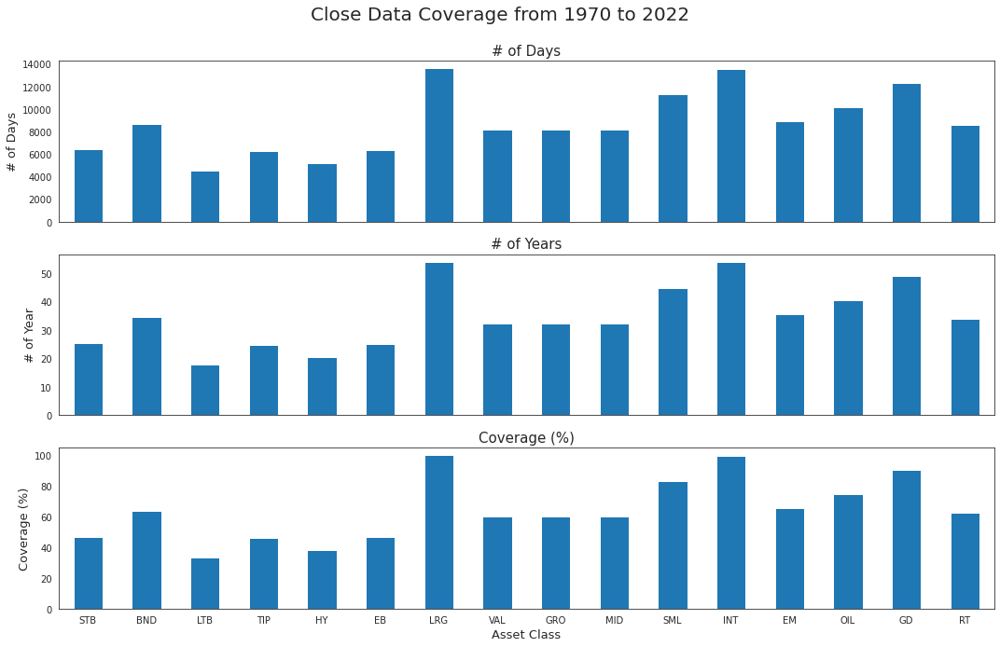

In [ ]:
df_cov_close = check_field_coverage(df_align, ls_ticker, dc_label, date_start, date_end, 'close')

One thing we also notice is that ***most asset classes does not have volume data***. Therefore, we are ***dropping volume data and will only focus on pricing data, including open, close, high and low prices***.

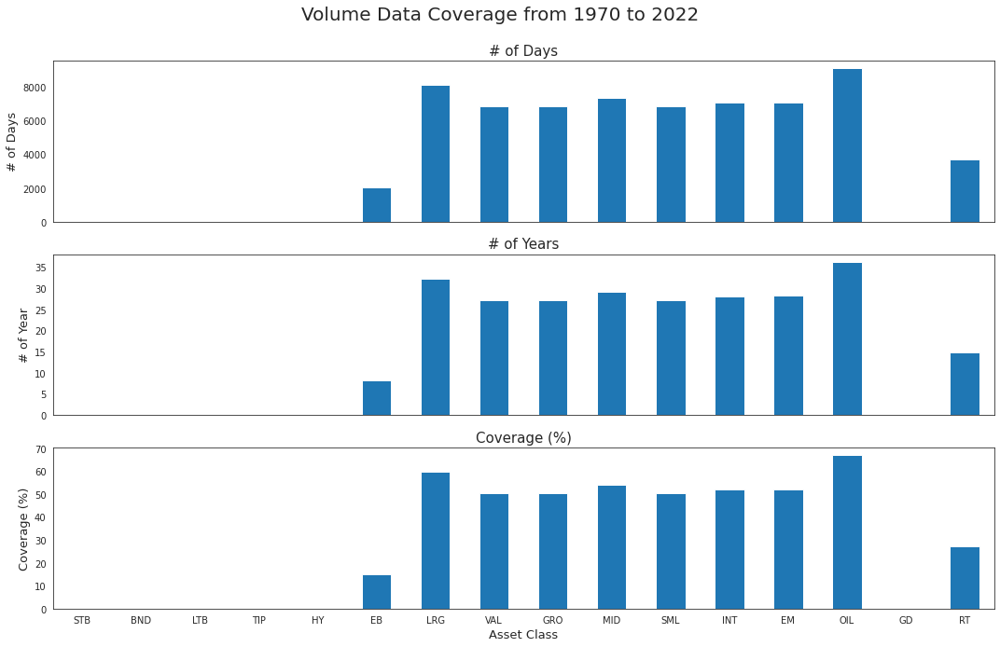

In [ ]:
df_cov_vol = check_field_coverage(df_align, ls_ticker, dc_label, date_start, date_end, 'volume')

**Forward return data used as response variable has similar coverage to price data.**

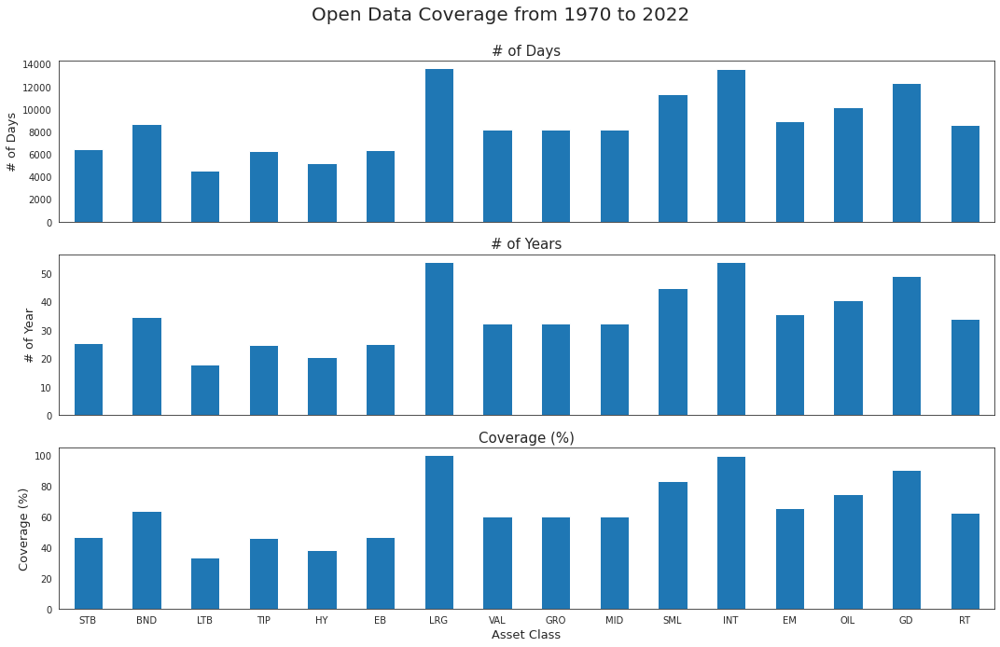

In [ ]:
df_cov_ret = check_field_coverage(df_align, ls_ticker, dc_label, date_start, date_end, 'open')

## distribution of response variable <div id='response_distribution'>

The distribution of upcoming 1 week return has ***substantial outliers*** for particular asset classes - for example, OIL briefly dropped to negative value recently, as can be seen in charts above and below. To mitigate the impact of these outliers, we ***winsorize (clip) the response variable at 5% and 95%*** based on their own distribution. After winsorization, the distribution of response variable looks more reasonable and ***lies between +/-8%***. This process is standard in finance.

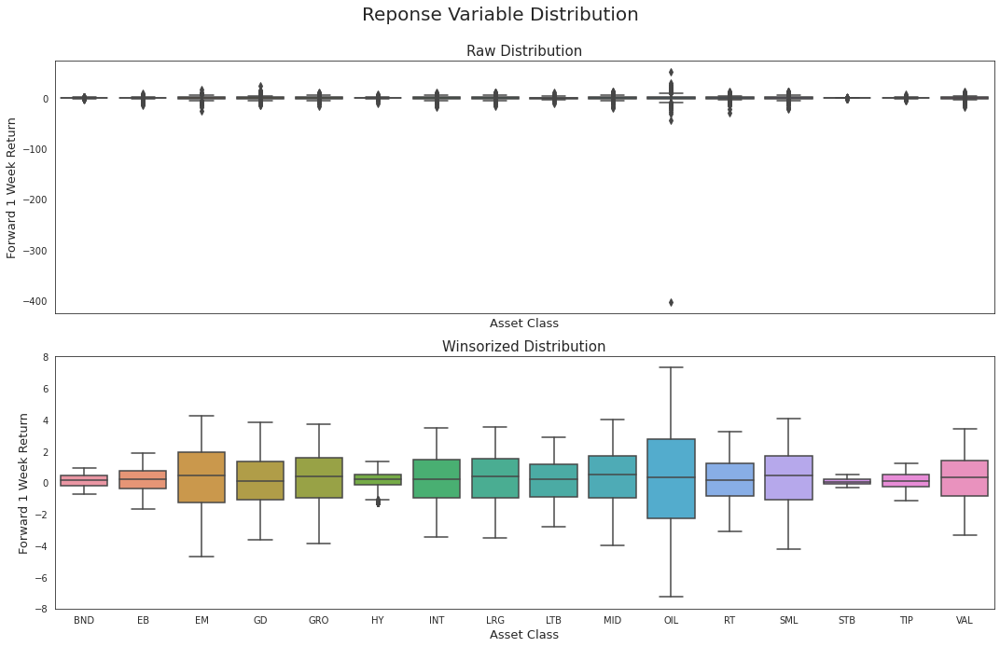

In [ ]:
df_clean = df_align[(df_align['date_num'] % 5 == 0) & 
                    (~df_align[ls_x + ['response']].isnull().any(axis=1))].reset_index(drop=True)

win_rate = 0.05

# winsorize response data
df_clean['lower'] = df_clean.groupby('ticker')['response'].transform(lambda x: x.quantile(win_rate))
df_clean['upper'] = df_clean.groupby('ticker')['response'].transform(lambda x: x.quantile(1 - win_rate))
df_clean['response_win'] = df_clean['response']
df_clean['response_win'] = np.where(df_clean['response_win'] > df_clean['upper'], df_clean['upper'], df_clean['response_win'])
df_clean['response_win'] = np.where(df_clean['response_win'] < df_clean['lower'], df_clean['lower'], df_clean['response_win'])

sns.set_style('white')
fig, axs = plt.subplots(2, 1, figsize=(15, 10), sharex=True)
fig.suptitle('Reponse Variable Distribution', fontsize=20)

ax = axs[0]
sns.boxplot(x='ticker', y='response', data=df_clean, ax=ax)
ax.set_title('Raw Distribution', fontsize=15)
ax.set_ylabel('Forward 1 Week Return', fontsize=13)
ax.set_xlabel('Asset Class', fontsize=13)
ax.tick_params(axis='x', rotation=0)

ax = axs[1]
sns.boxplot(x='ticker', y='response_win', data=df_clean, ax=ax)
ax.set_title('Winsorized Distribution', fontsize=15)
ax.set_ylabel('Forward 1 Week Return', fontsize=13)
ax.set_xlabel('Asset Class', fontsize=13)
ax.tick_params(axis='x', rotation=0)

fig.tight_layout(rect=[0, 0.02, 1, 0.98])

## correlation among predictors <div id='predictor_correlation'>

Below is the correlation plot of predictors, with ***plenty of them highly correlated***. And this does make intuitive sense, since predictors from the same day (high, low, open and close) are supposed to be closer to each other than other days. However, this high correlation would create the ***multi-collinearity issue for regression***, which we will use as baseline model. Instead, we will do a ***PCA analysis first to extract the major features of the predictors*** and then ***run regression of response variables against the important principal components***.

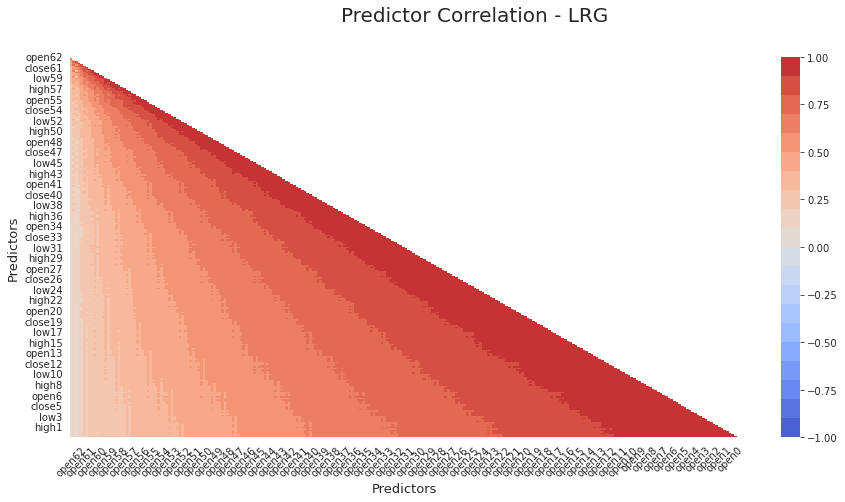

In [ ]:
ticker = 'LRG'
mask = df_clean['ticker'] == ticker
df_sample =  df_clean.loc[mask].copy().reset_index(drop=True)
df_cor = df_sample[ls_x].corr()
mask = np.zeros_like(df_cor)
mask[np.triu_indices_from(mask)] = True

sns.set_style('white')
fig, ax = plt.subplots(1, 1, figsize=(15, 7))
fig.suptitle('Predictor Correlation - %s' % (ticker), fontsize=20)

cmap = sns.color_palette('coolwarm', 20)
sns.heatmap(df_cor, mask=mask, vmax=1, vmin=-1, cmap=cmap, ax=ax)
ax.set_ylabel('Predictors', fontsize=13)
ax.set_xlabel('Predictors', fontsize=13)
ax.tick_params(axis='x', rotation=45)

## PCA analysis of predictors <div id='predictor_pca'>

Below is the cumulative explained variance of ***PCA analysis on 252 predictors***. As we can see, the ***first 10 principal components play very important roles in explaining the variance***. Therefore, we will use the first 10 principal components for baseline model.

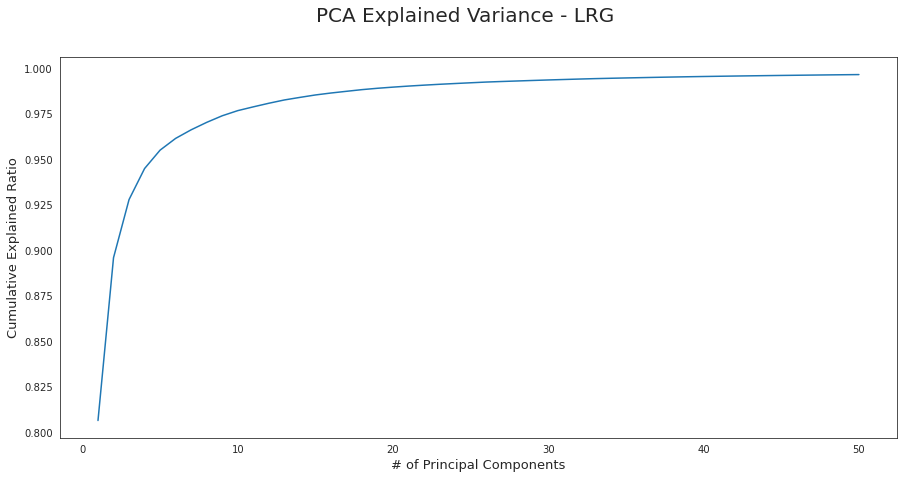

In [ ]:
pca = PCA()
X = df_sample[ls_x]
df_pca = pca.fit_transform(X)

sns.set_style('white')
fig, ax = plt.subplots(1, 1, figsize=(15, 7))
fig.suptitle('PCA Explained Variance - %s' % (ticker), fontsize=20)

pca_ratio = pca.explained_variance_ratio_ / np.sum(pca.explained_variance_ratio_)
pca_ratio_cum = np.cumsum(pca_ratio)
ax.plot(list(range(1, 51)), pca_ratio_cum[:50])
ax.set_xlabel('# of Principal Components', fontsize=13)
ax.set_ylabel('Cumulative Explained Ratio', fontsize=13);

## correlation of PCA with response <div id='pca_response'>

We do see that ***very little correlations of principal components with response***. With these components uncorrelated with each other, there would likely very few features to be picked up by regression.

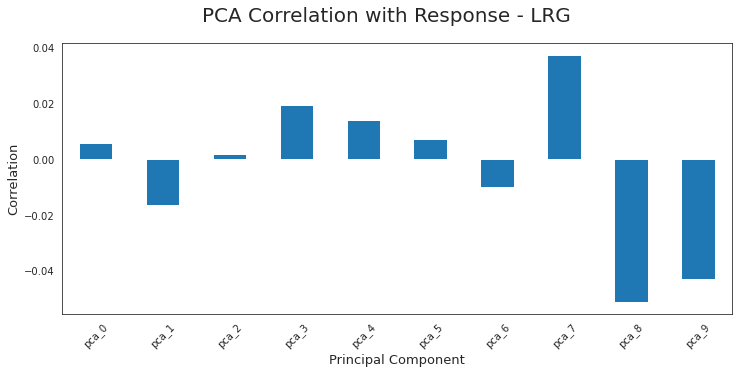

In [ ]:
num_pca = 10
df_sample_pca = df_sample.copy()

ls_pca = ['pca_%d' % (x) for x in range(num_pca)]
df_sample_pca = df_sample.copy()
df_sample_pca[ls_pca] = df_pca[:,:10]

df_cor_pca = df_sample_pca[ls_pca + ['response_win']].corr()
df_cor_pca = df_cor_pca.loc[df_cor_pca.index == 'response_win', ls_pca]

sns.set_style('white')
fig, ax = plt.subplots(1, 1, figsize=(12, 5))
fig.suptitle('PCA Correlation with Response - %s' % (ticker), fontsize=20)

df_cor_pca.T.plot.bar(ax=ax)
ax.set_ylabel('Correlation', fontsize=13)
ax.set_xlabel('Principal Component', fontsize=13)
ax.tick_params(axis='x', rotation=45)
ax.legend().set_visible(False)

# Convert Processed Data to Graphs <div id='data_to_image'>

## Image Description

Below is an example of daily return chart of ***LRG (US Large Cap Core Equity)***, with the top panel as ***pricing*** and bottom as ***trading volume***. Daily prices of this asset class are represented as a ***candle chart***, with one candle per day. Top and bottom edges of the candle represent the open and close price or vice versa. Sticks on the top and bottom represents the intraday high and low prices.

<img src='bbg chart.png' width=800px>

In this project, it would take tremendous and meaningless efforts to download this chart for each asset class every day for **53 years**. Instead, the data behind the chart is downloaded and will be converted back to chart format using the techniques mentioned in section 1 above.

<img src='bbg data.png' width=800px>

In [ ]:
# Put information in relevant shape for converting to images, based on the two methods (GAF and MTF) detailed earlier
df_shape = pd.DataFrame()
ls_lag = [str(x) for x in range(max(ls_lookback) - 1, -1, -1)]
for pred in ls_pred:
    ls_temp = [pred + str(x) for x in range(max(ls_lookback) - 1, -1, -1)]

    # keep weekly data
    df_temp = df_clean[['date','ticker','response', 'response_win'] + ls_temp].copy()
    df_temp.columns = ['date','ticker','response', 'response_win'] + ls_lag
    df_temp['metric'] = pred
    df_shape = df_shape.append(df_temp, ignore_index=True)

df_target = df_shape.loc[df_shape['metric'] == ls_pred[0], 
                         ['date', 'ticker', 'response', 'response_win']].reset_index(drop=True)

In [ ]:
# 
%%time
# %matplotlib agg
if not os.path.exists(pkl_image):
    dc_image = {}
    for lookback in ls_lookback:
        print(f'Lookback window {lookback}...')
        dc_image[lookback] = {}
        for ticker in ls_ticker:
            print(f'~~~Security {ticker}...')
            df_ticker = df_shape[df_shape['ticker'] == ticker].reset_index(drop=True)

            image_tool = TS_Image(data=df_ticker, ticker=ticker, dir_path=dir_in, methods=methods, lookback=lookback, freq=1)
            samples = image_tool.getImage()
            dc_image[lookback][ticker] = samples
            gc.collect(generation=2)
    with open(pkl_image, 'wb') as p:
        pickle.dump(dc_image, p)
        p.close()
else:
    with open(pkl_image, 'rb') as p:
        dc_image = pickle.load(p)
# %matplotlib inline

CPU times: user 593 ms, sys: 807 ms, total: 1.4 s
Wall time: 1.41 s


# Baseline Model <div id='baseline_model'>

## simple linear regression <div id='linear_regression'>

A simple ***multi-linear regression model*** is used here as the baseline model, with the ***forward 5 day return as the response variable*** and ***trailing 21 or 63 days of data included as predictors***.
 
***We split the data into training and test data with the date of 2007/12/31***. All models in this project are fitted with training data and evaluated with test data.

Initially, solely looking at the relationship matrix above between the predictors and the response variable, it was clear that ***there is little linear relationship between them***. We suspect that ***PCA focus too much on capturing the noise without the intention to extract informative features*** for future predictions. Our multi-linear model produced the following scores.

<img src='linear regression.png' width=500px>

A ***decent deterioration in MSE and R2 score*** is observed in linear regression model, with both train and test close to zero.

Based on the residual plot, residuals are mostly ***scattered evenly above and below the horizontal zero line***. This means that our model does not capture enough information features from predictors. Based on this bar plot of regression coefficients, some features seem to contribute positively for prediction. Unfortunately, ***these features extracted by PCA does not seem to help much from explanation perspective***.

Processing lookback window: 21
~~~Ticker of STB
   ~~~Train/Test MSE: 0.0586/0.0447
   ~~~Train/Test R2: 0.0216/-0.0486
ok
~~~Ticker of BND
   ~~~Train/Test MSE: 0.2074/0.1871
   ~~~Train/Test R2: 0.0131/-0.0265
ok
~~~Ticker of LTB
   ~~~Train/Test MSE: 1.3062/2.7132
   ~~~Train/Test R2: 0.0254/-0.0493
ok
~~~Ticker of TIP
   ~~~Train/Test MSE: 0.3343/0.4282
   ~~~Train/Test R2: 0.0273/-0.0856
ok
~~~Ticker of HY
   ~~~Train/Test MSE: 0.2240/0.4386
   ~~~Train/Test R2: 0.2241/-0.0340
ok
~~~Ticker of EB
   ~~~Train/Test MSE: 0.9350/0.6776
   ~~~Train/Test R2: 0.0339/0.0103
ok
~~~Ticker of LRG
   ~~~Train/Test MSE: 3.3597/3.3407
   ~~~Train/Test R2: 0.0130/-0.0121
ok
~~~Ticker of VAL
   ~~~Train/Test MSE: 2.7746/3.3453
   ~~~Train/Test R2: 0.0234/-0.0215
ok
~~~Ticker of GRO
   ~~~Train/Test MSE: 3.8163/4.0267
   ~~~Train/Test R2: 0.0401/-0.0501
ok
~~~Ticker of MID
   ~~~Train/Test MSE: 3.9730/4.7120
   ~~~Train/Test R2: 0.0260/-0.0158
ok
~~~Ticker of SML
   ~~~Train/Test MSE: 4.0917/5.7444

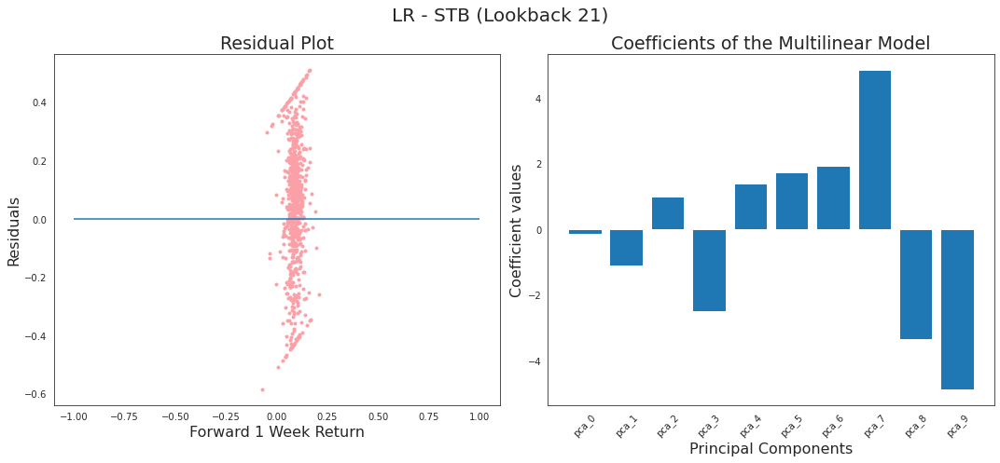

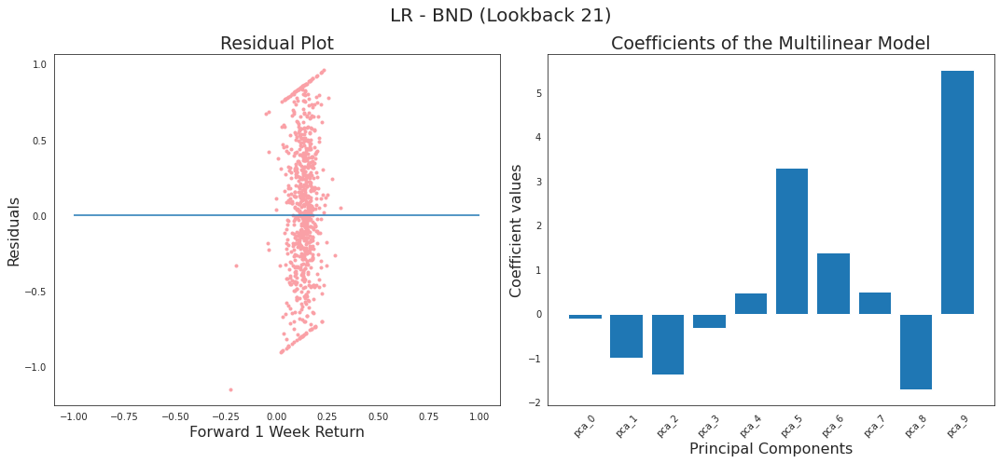

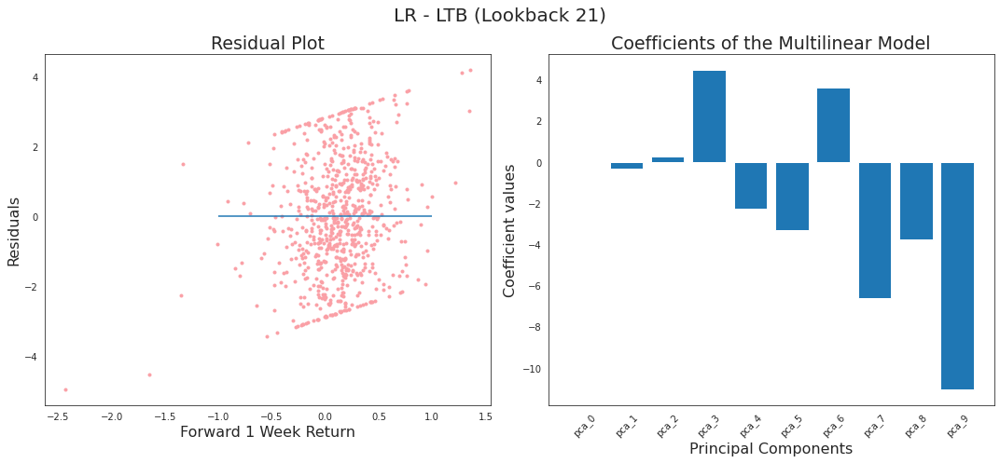

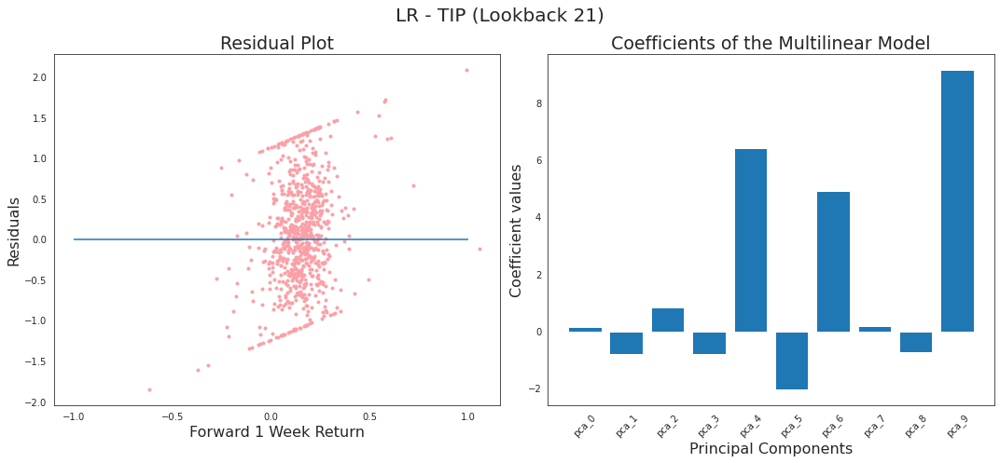

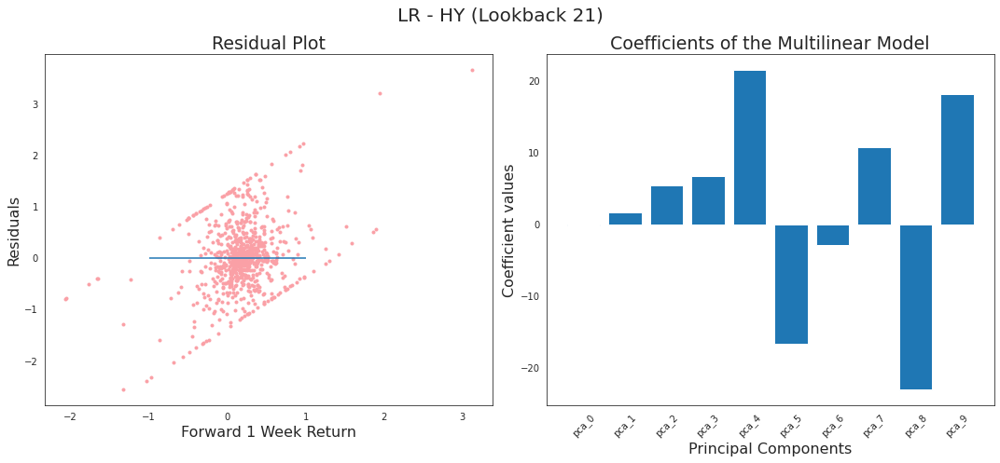

...

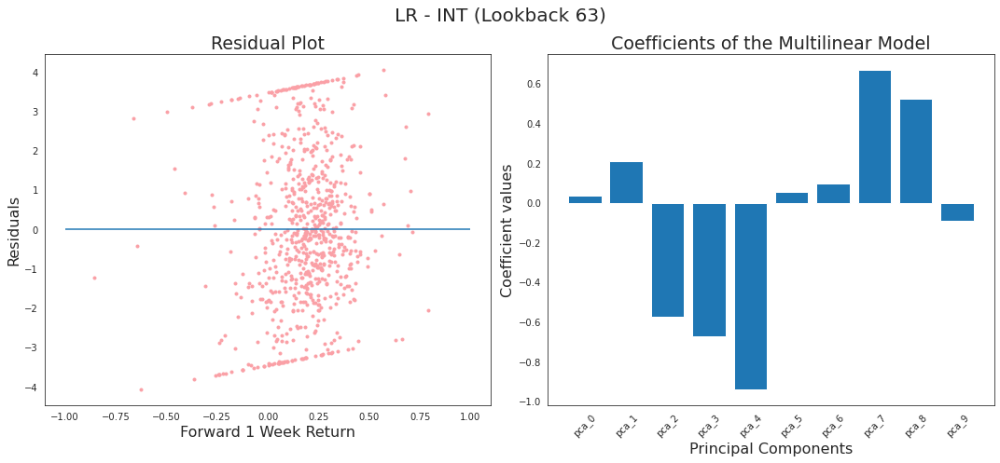

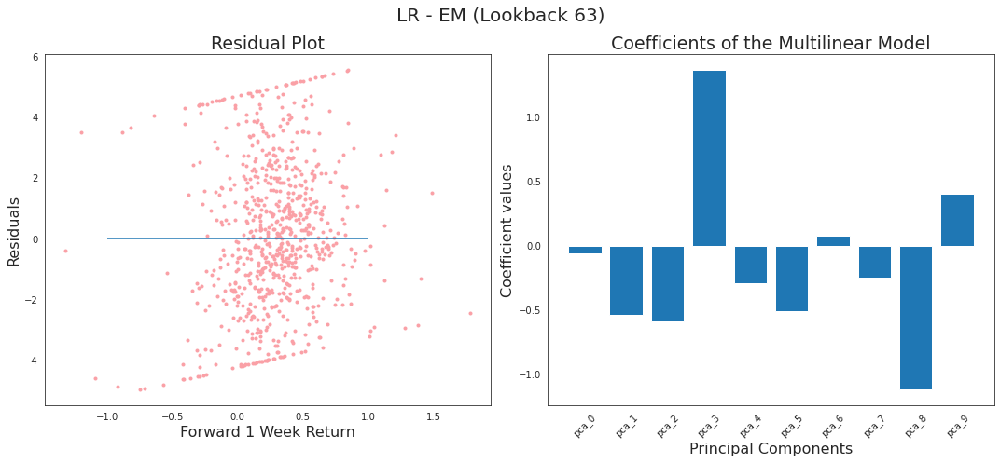

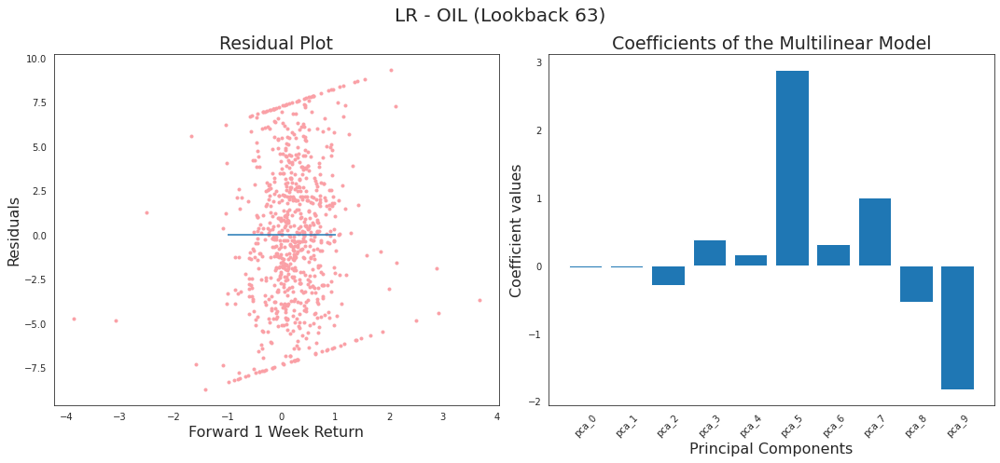

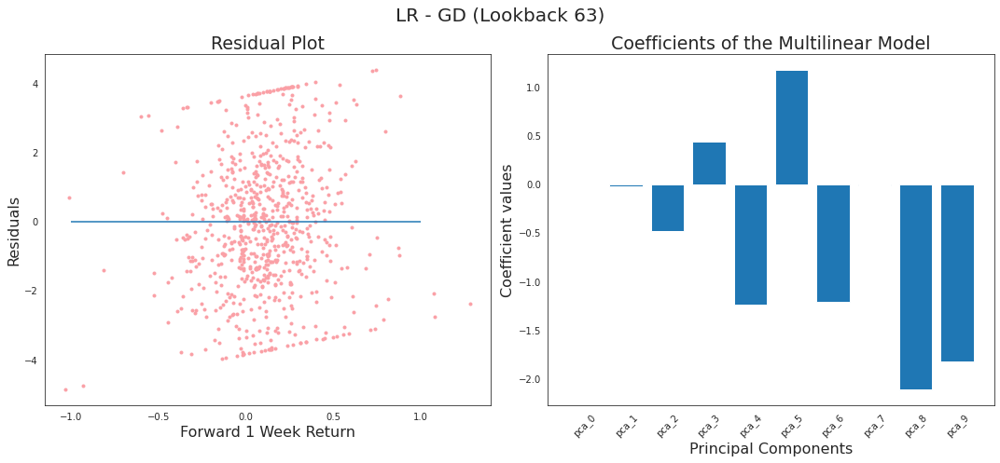

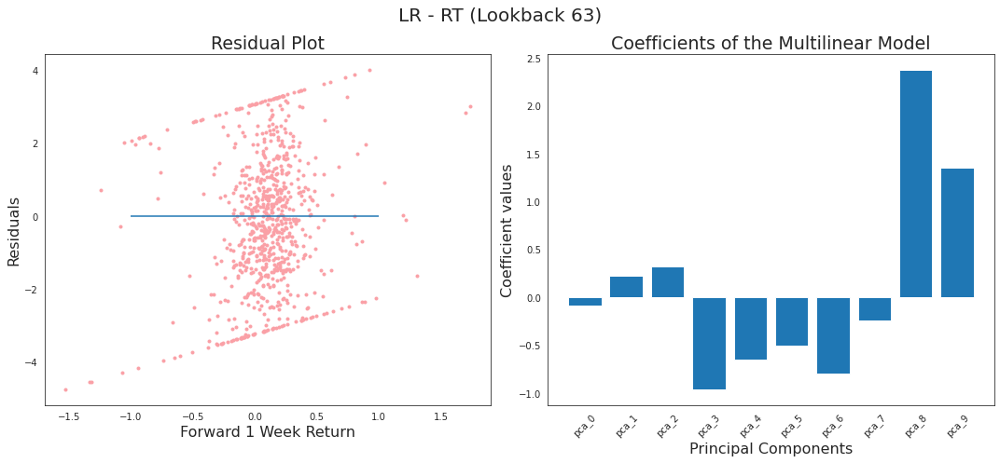

In [ ]:
dc_model = {}
method = 'LR'

for lookback in ls_lookback:
    print('Processing lookback window: %d' % (lookback))
    # list of predictors
    ls_x = [pred + str(lag) for lag in range(lookback - 1, -1, -1) for pred in ls_pred]

    df_pred = pd.DataFrame(columns=ls_ticker)
    df_sum = pd.DataFrame(columns=ls_ticker, index=['mse_train', 'mse_test', 'r2_train', 'r2_test'])
    for ticker in ls_ticker:
        print('~~~Ticker of %s' % (ticker))
        # get train test split data and get PCA components
        df_train, df_test, X_train, X_test, y_train, y_test = gen_train_test_data(df_clean, ticker, date_split, ls_x, 
                                                                                  num_pca, 'response_win', add_pca=True)

        # create and fit model
        model = linear_regression_model(X_train, y_train)
        
        # summarize model output
        dc_sum, y_pred = summarize_model_output(model, X_train, X_test, y_train, y_test)

        #Residual and coefficient plot
        residual_coefficient_plot(model, y_pred, y_test, X_test, ticker, method, lookback)
        print('ok')
        df_pred[ticker] = y_pred
        df_sum[ticker] = dc_sum.values()

    df_pred['date'] = df_test['date']

    dc_model['%s_%d' % (method, lookback)] = {'sum': df_sum, 'pred': df_pred}

## FFNN <div id='ffnn'>

To improve model performance, we also set up another ***baseline model of FFNN***. The model is fully connected, with 3 layers and 100 nodes each layer.

From the history plot, we can tell that the model is getting some ***overfitting with MSE of test data stablizing and even going up***. 

<img src='ffnn.jpg' width=600px>

Processing lookback window: 21
~~~Ticker: STB
   ~~~Train/Test MSE: 0.0703/0.0448
   ~~~Train/Test R2: -0.1728/-0.0514
~~~Ticker: BND
   ~~~Train/Test MSE: 0.2156/0.1821
   ~~~Train/Test R2: -0.0257/0.0010
~~~Ticker: LTB
   ~~~Train/Test MSE: 1.3494/2.5912
   ~~~Train/Test R2: -0.0069/-0.0021
~~~Ticker: TIP
   ~~~Train/Test MSE: 0.3449/0.4086
   ~~~Train/Test R2: -0.0036/-0.0360
~~~Ticker: HY
   ~~~Train/Test MSE: 0.3376/0.4977
   ~~~Train/Test R2: -0.1697/-0.1732
~~~Ticker: EB
   ~~~Train/Test MSE: 0.9847/0.7391
   ~~~Train/Test R2: -0.0175/-0.0795
~~~Ticker: LRG
   ~~~Train/Test MSE: 3.4042/3.3073
   ~~~Train/Test R2: -0.0000/-0.0020
~~~Ticker: VAL
   ~~~Train/Test MSE: 2.8504/3.2871
   ~~~Train/Test R2: -0.0033/-0.0037
~~~Ticker: GRO
   ~~~Train/Test MSE: 3.9772/3.8430
   ~~~Train/Test R2: -0.0004/-0.0022
~~~Ticker: MID
   ~~~Train/Test MSE: 4.0998/4.6609
   ~~~Train/Test R2: -0.0051/-0.0048
~~~Ticker: SML
   ~~~Train/Test MSE: 4.2546/5.7330
   ~~~Train/Test R2: -0.0201/-0.0213
~~~T

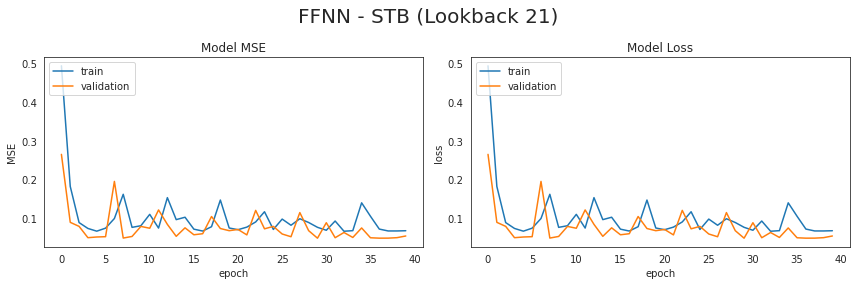

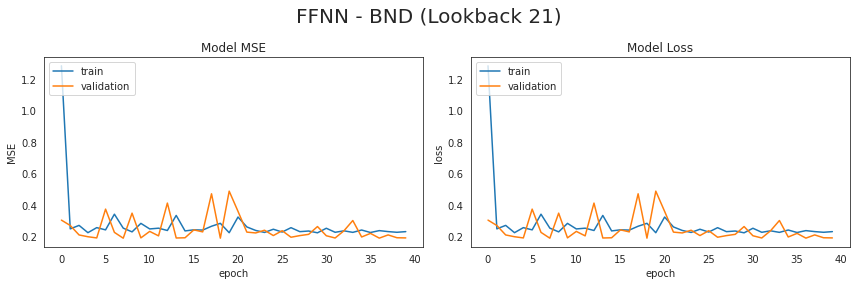

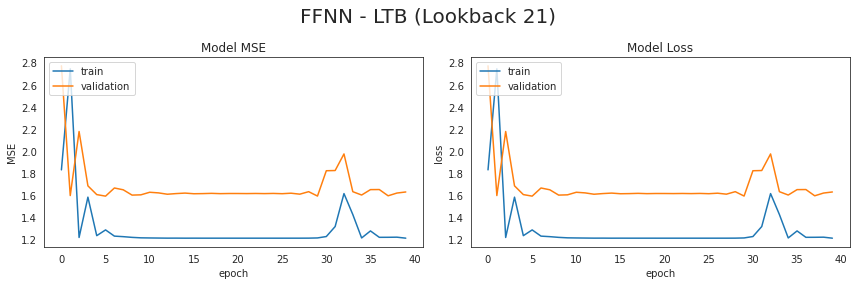

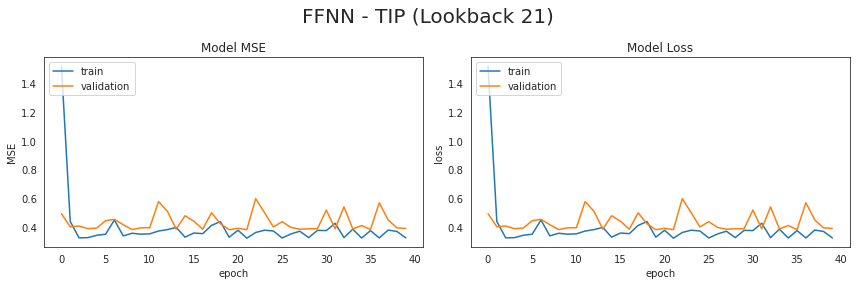

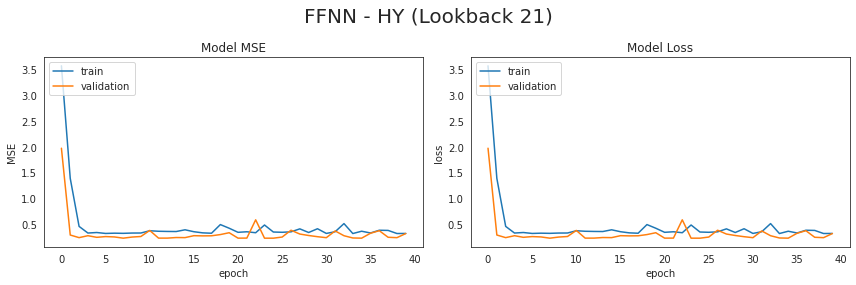

...

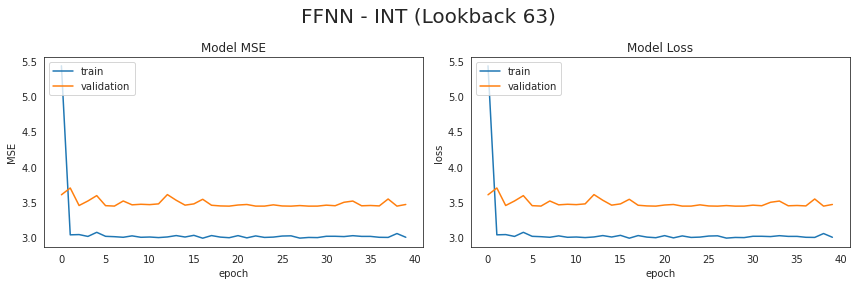

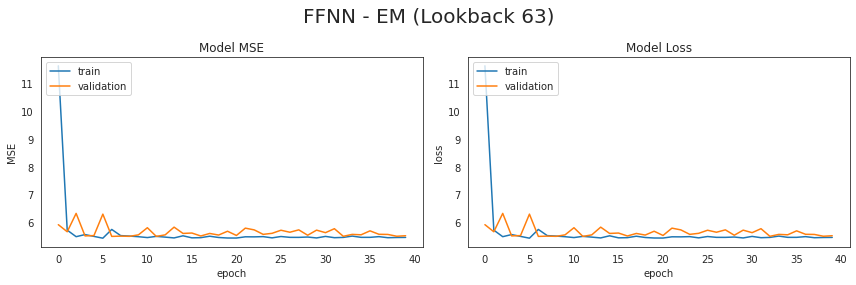

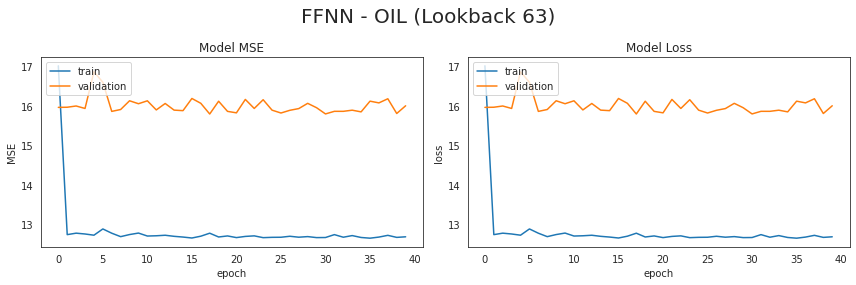

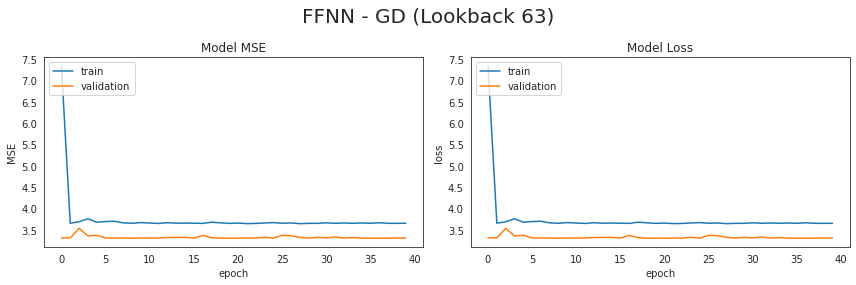

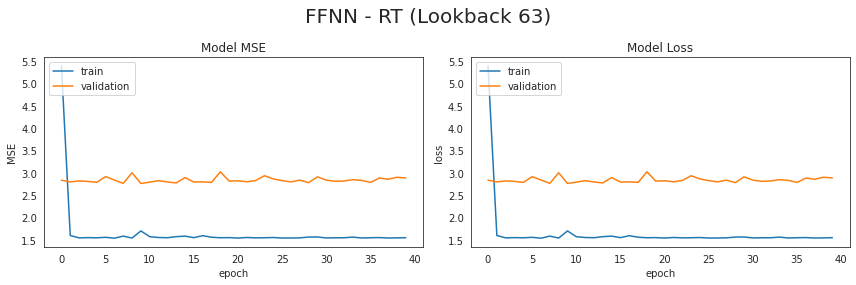

In [ ]:
batch_size = 128
activation = 'tanh'
num_layer = 3
kernel_size = [100 for i in range(num_layer)]
epochs = 40
is_batchnorm = False
is_dropout = False
dropout = 0.2
task_type = 'linear'

optimizer = Adam(learning_rate=0.002, beta_1=0.5, beta_2=0.9)
loss = 'mse'
metrics = ['mse']
validation_split = 0.33

method = 'FFNN'
for lookback in ls_lookback:
    print('Processing lookback window: %d' % (lookback))
    # list of predictors
    ls_x = [pred + str(lag) for lag in range(lookback - 1, -1, -1) for pred in ls_pred]
    
    df_pred = pd.DataFrame(columns=ls_ticker)
    df_sum = pd.DataFrame(columns=ls_ticker, index=['mse_train', 'mse_test', 'r2_train', 'r2_test'])
    for ticker in ls_ticker:
        print('~~~Ticker: %s' % (ticker))
        # get train test split data and get PCA components
        df_train, df_test, X_train, X_test, y_train, y_test = gen_train_test_data(df_clean, ticker, date_split, ls_x, 
                                                                                  num_pca, 'response_win')

        # create model
        input_size = X_train.shape[-1]
        model = simple_ffnn_model(input_size, num_layer, kernel_size, activation, is_batchnorm, is_dropout, 
                          task_type, dropout)

        # fit model
        model, history = fit_nn_model(model, X_train, y_train, optimizer, loss, metrics, validation_split, 
                                      batch_size, epochs)

        # summarize model output
        dc_sum, y_pred = summarize_model_output(model, X_train, X_test, y_train, y_test)

        # history plot
        plot_loss(history, ticker, method, lookback)
        df_pred[ticker] = y_pred
        df_sum[ticker] = dc_sum.values()

    df_pred['date'] = df_test['date']

    dc_model['%s_%d' % (method, lookback)] = {'sum': df_sum, 'pred': df_pred}

# Deep NN Model <div id='deep_nn'>

## CNN <div id='cnn'>

To capture the technical and visual part of pricing data, we start to utilize deeper and more complicated neural networks. The first try is ***CNN***, which is good at processing image data. Here we will try 3 methods of image transformation including ***GADF, GASF and MTF***.

From the history plot, we can tell that the model is getting some ***overfit with MSE of test data stablizing and even going up***. 

<img src='cnn.jpeg' width=700px>

Processing lookback window: 21
~Method: GADF
~~~Ticker: STB


2022-05-06 14:40:49.136119: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


   ~~~Train/Test MSE: 0.0657/0.0532
   ~~~Train/Test R2: -0.0470/-0.2466
~~~Ticker: BND
Restoring model weights from the end of the best epoch: 10.
Epoch 25: early stopping
   ~~~Train/Test MSE: 0.2009/0.1833
   ~~~Train/Test R2: -0.0137/-0.0058
~~~Ticker: LTB
Restoring model weights from the end of the best epoch: 1.
Epoch 16: early stopping
   ~~~Train/Test MSE: 1.1687/2.6228
   ~~~Train/Test R2: -0.0037/-0.0144
~~~Ticker: TIP
   ~~~Train/Test MSE: 0.3458/0.4042
   ~~~Train/Test R2: -0.0007/-0.0249
~~~Ticker: HY
Restoring model weights from the end of the best epoch: 1.
Epoch 16: early stopping
   ~~~Train/Test MSE: 0.3146/0.4431
   ~~~Train/Test R2: -0.1604/-0.0446
~~~Ticker: EB
Restoring model weights from the end of the best epoch: 20.
Epoch 35: early stopping
   ~~~Train/Test MSE: 1.0055/0.7264
   ~~~Train/Test R2: -0.0332/-0.0610
~~~Ticker: LRG
   ~~~Train/Test MSE: 3.4269/3.3007
   ~~~Train/Test R2: -0.0037/0.0000
~~~Ticker: VAL
   ~~~Train/Test MSE: 3.8137/4.4222
   ~~~Train/T

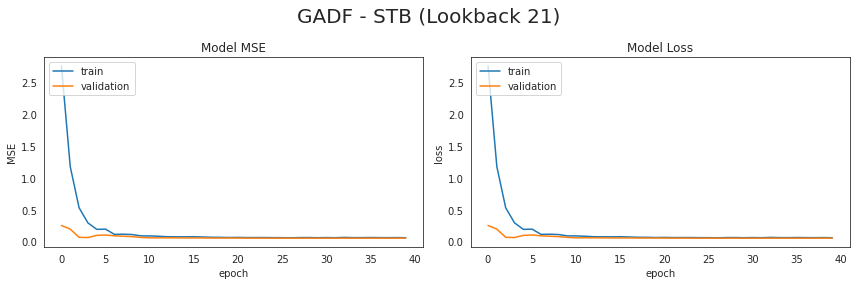

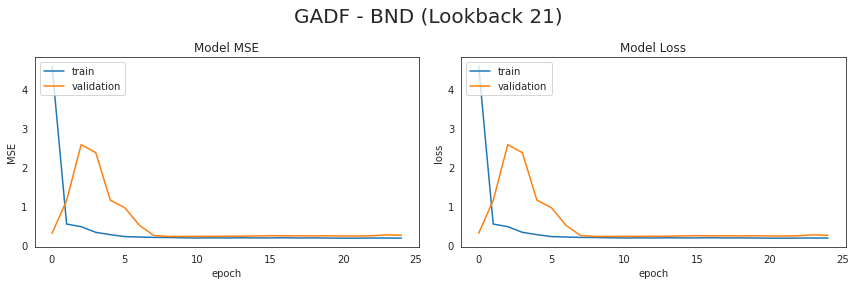

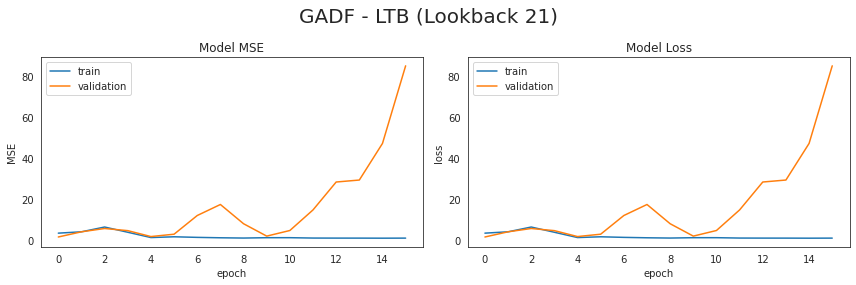

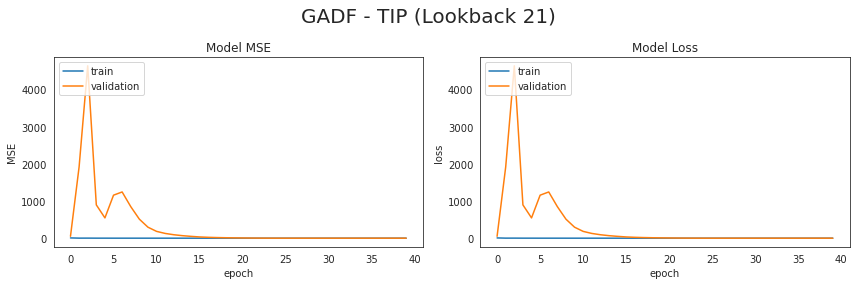

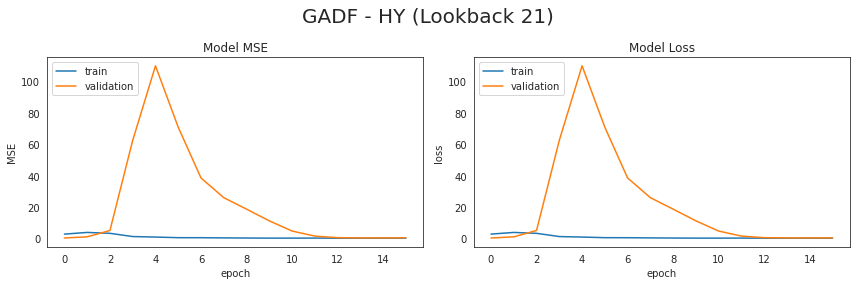

...

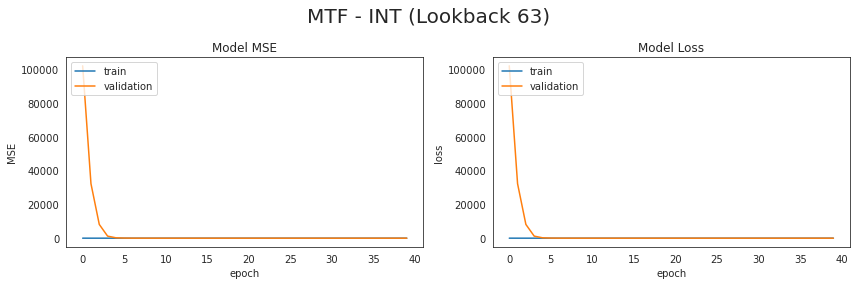

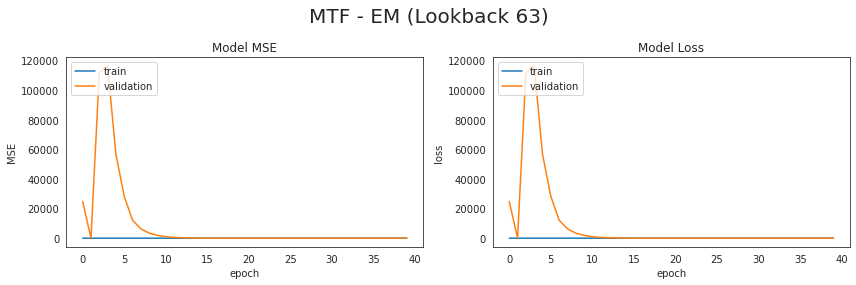

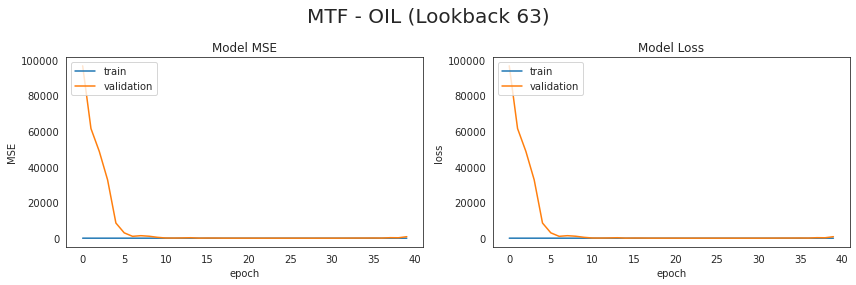

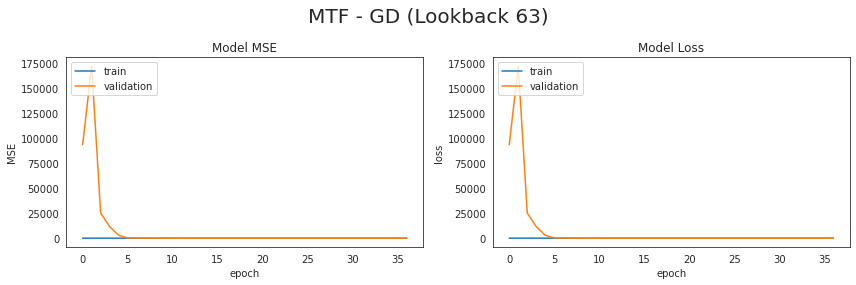

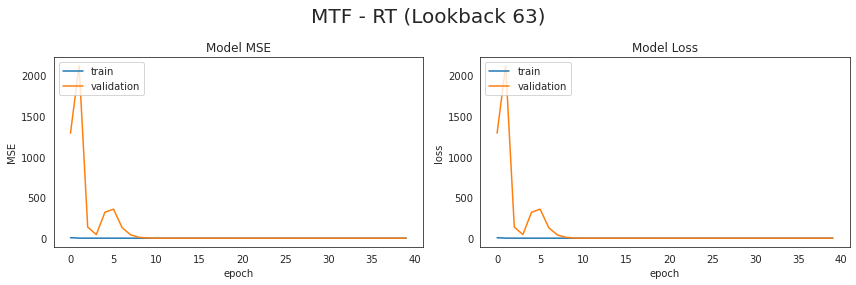

In [ ]:
batch_size = 128
input_size = [16, 16, 4]
kernel_size = (2, 2)
pool_size = (2, 2)
stride_size = (1, 1)
epochs = 40

# for 63d lookback window, we use 4 building blocks
num_cblock = 3
filters_size = [16, 32, 64]

es = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True, verbose=1)
optimizer = Adam(learning_rate=0.025, beta_1=0.9, beta_2=0.999)
loss = 'mse'
metrics = ['mse']
validation_split = 0.33

for lookback in ls_lookback:
    print('Processing lookback window: %d' % (lookback))
    # list of predictors
    ls_x = [pred + str(lag) for lag in range(lookback - 1, -1, -1) for pred in ls_pred]
    dc_image_lookback = dc_image[lookback]

    for method in methods:
        df_pred = pd.DataFrame(columns=ls_ticker)
        df_sum = pd.DataFrame(columns=ls_ticker, index=['mse_train', 'mse_test', 'r2_train', 'r2_test'])
        print('~Method: %s' % (method))
        for ticker in ls_ticker:
            print('~~~Ticker: %s' % (ticker))
            asset_class = [ticker]

            # prepare data
            ds_train, ds_val, ds_test, (y_train, y_test) = gen_train_val_test(dc_image_lookback, df_target, date_split, 
                                                                              asset_class, method, 'response_win', 
                                                                              val_size=validation_split, batch_size=batch_size)

            # construct model
            inputs = Input(input_size)
            outputs = conv_architect(inputs, num_cblock=num_cblock, filters_size=filters_size, kernel_size=kernel_size, 
                                     pool_size=pool_size,stride_size=stride_size)
            model = Model(inputs=inputs, outputs=outputs)

            # compile and run model
            model.compile(optimizer=optimizer, loss=loss, metrics=metrics)
            history = model.fit(ds_train, validation_data=ds_val, epochs=epochs, verbose=0, callbacks=[es])

            # summarize model output
            dc_sum, y_pred = summarize_model_output(model, ds_train, ds_test, y_train, y_test)

            # history plot
            plot_loss(history, ticker, method, lookback)
            df_pred[ticker] = y_pred
            df_sum[ticker] = dc_sum.values()

            del model
            del history
            del y_train
            del y_test
            gc.collect(generation=2)

        df_pred['date'] = df_test['date']

        dc_model['%s_%d' % (method, lookback)] = {'sum': df_sum, 'pred': df_pred}

## LSTM <div id='rnn'>

To capture the sequential and time series nature of pricing data, we start to utilize RNN, specially its complicated forms ***LSTM***. Motivation is LSTM was one of the neural network forms that are best suited for time series prediction. Therefore, it would be interesting to see how it performs compared to image processing via CNN.

<img src='rnn.png' width=700px>

From the history plot, we can tell that the model is getting some ***overfit with MSE of test data stablizing and even going up***. 

<img src='lstm.png' width=700px>

## LSTM based on return <div id='lstm_return'>

Creates 21 week windows of weekly return data, and then feeds those into a Long Short-Term Memory NN which attempts to predict the 22nd weeks return, repeatedly.

~~~Ticker: STB
   ~~~Train/Test MSE: 0.0174/0.0134
   ~~~Train/Test R2: -0.0026/-0.0254
~~~Ticker: BND
   ~~~Train/Test MSE: 0.0466/0.0620
   ~~~Train/Test R2: 0.0029/-0.0310
~~~Ticker: LTB
   ~~~Train/Test MSE: 0.2952/0.8942
   ~~~Train/Test R2: 0.0008/-0.0055
~~~Ticker: TIP
   ~~~Train/Test MSE: 0.0959/0.1598
   ~~~Train/Test R2: -0.0032/-0.0074
~~~Ticker: HY
   ~~~Train/Test MSE: 0.0395/0.1060
   ~~~Train/Test R2: 0.0298/-0.0071
~~~Ticker: EB
   ~~~Train/Test MSE: 0.2799/0.3891
   ~~~Train/Test R2: 0.1763/-0.4618
~~~Ticker: LRG
   ~~~Train/Test MSE: 0.8477/1.6722
   ~~~Train/Test R2: 0.0076/-0.1044
~~~Ticker: VAL
   ~~~Train/Test MSE: 0.6351/1.9686
   ~~~Train/Test R2: 0.0807/-0.1651
~~~Ticker: GRO
   ~~~Train/Test MSE: 1.2101/1.6741
   ~~~Train/Test R2: 0.0823/-0.0432
~~~Ticker: MID
   ~~~Train/Test MSE: 0.9039/2.3837
   ~~~Train/Test R2: 0.0657/-0.1211
~~~Ticker: SML
   ~~~Train/Test MSE: 0.9069/2.8697
   ~~~Train/Test R2: -0.0146/-0.0640
~~~Ticker: INT
   ~~~Train/Test MSE: 0.705

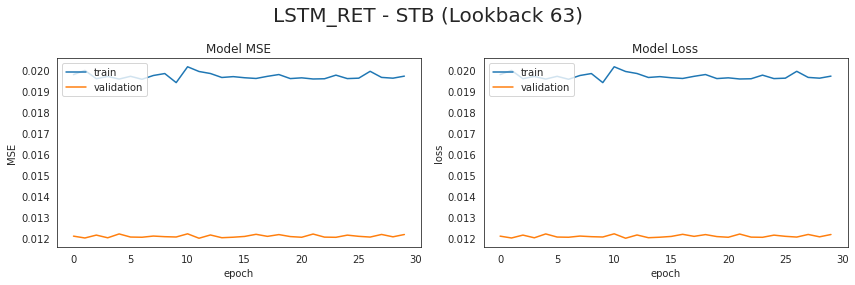

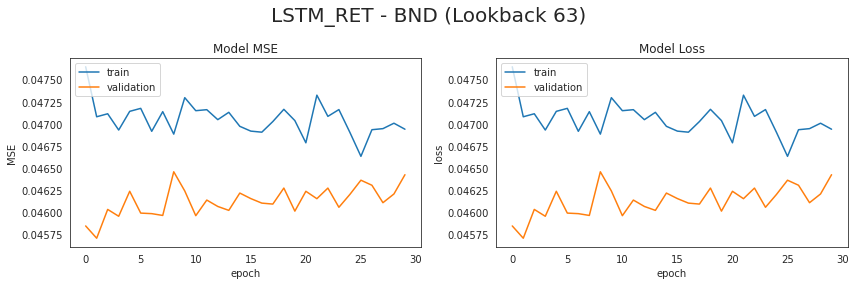

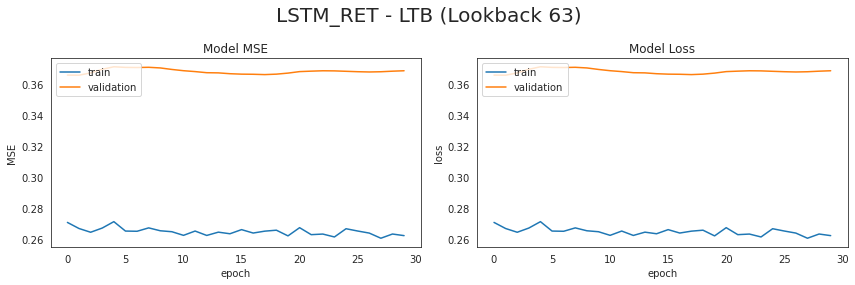

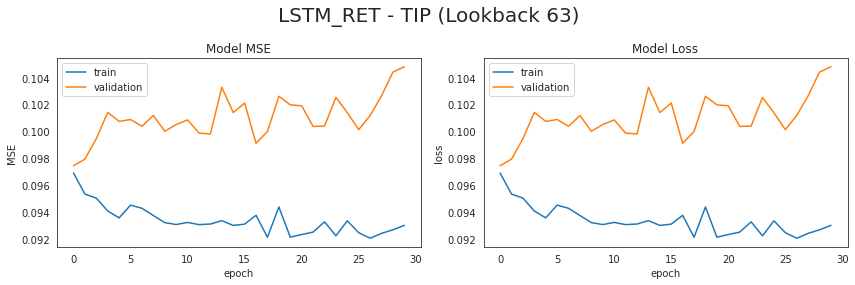

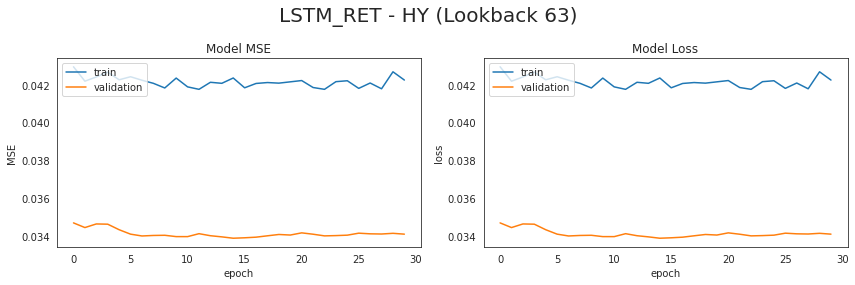

...

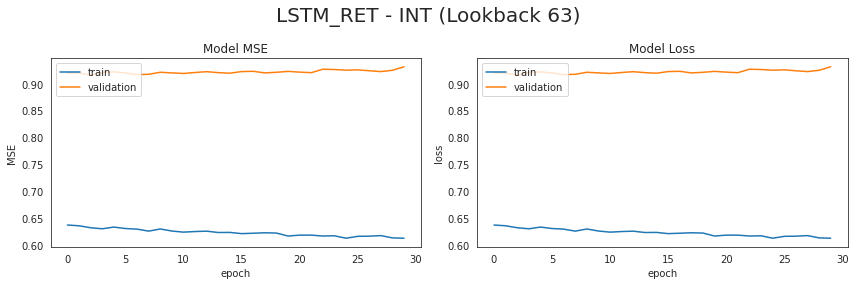

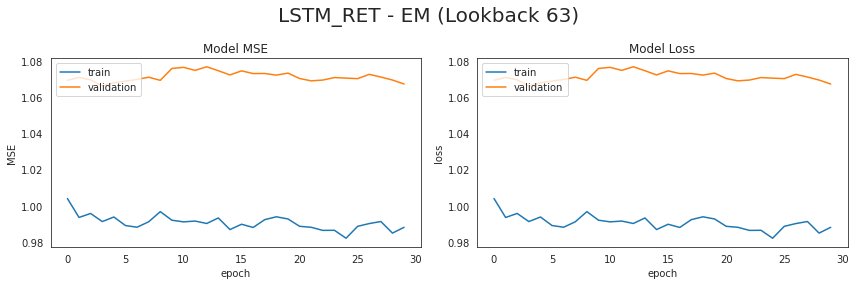

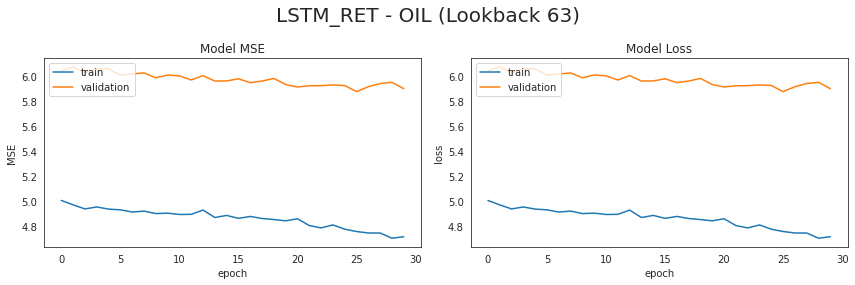

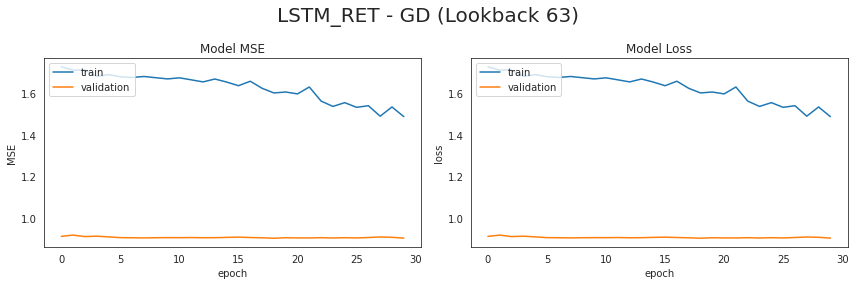

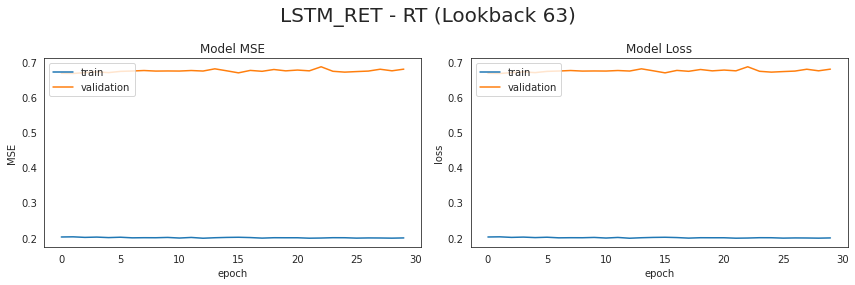

In [ ]:
"""
Model parameters
Lookback window length - 21 consistently outperformed other intervals, of 3, 7, 21, 63
Number of units in each LSTM layer
Number of LSTM layers
Dropout layer yes/no
Optimizer Learning Rate
Train/Validation Split
# of Epochs

All parameters were tuned the same way - first by creating a model which overfit as much as possible, so as to find
architecture which is capable of learning the data, then tuning these parameters to optimize validation accuracy.

The structure which overfit the most was a lookback window of 21, 50 units, two layers, no dropout, 1e-2 learning rate, and 500 epochs
Tuning these parameters to reduce the gap between train and validation MSE brings us to the model outlines below

"""
LOOKBACK = 21
UNITS = 50
LAYERS = 1
DROPOUT = True
LEARNING_RATE = 1e-3
DROPOUT_RATE = .2
VALIDATION_SPLIT = .3
EPOCHS = 30

method = 'LSTM_RET'
lookback = 63
# Iterate through all asset classes one by one

df_pred = pd.DataFrame(columns=ls_ticker)
df_sum = pd.DataFrame(columns=ls_ticker, index=['mse_train', 'mse_test', 'r2_train', 'r2_test'])

for ticker in ls_ticker:
    print('~~~Ticker: %s' % (ticker))

    # get the train/test data for this ticker
    df_temp = df_clean.loc[df_clean['ticker'] == ticker].reset_index(drop=True)
    df_train = df_temp.loc[df_temp['date'] <= date_split]
    df_test = df_temp.loc[df_temp.index >= df_temp[df_temp['date'] > date_split].index.min() - LOOKBACK - 1]

    # Reshape into our desired format. Since we are just forecasting, i.e. using a sequence of values to predict the next
    # weeks data, our inputs are 21x1 (21 weeks of returns) and our output is the return that immediately follows #21
    X_train, y_train = df_clean_into_returns_forecasting(df_train, ticker, LOOKBACK)
    X_test, y_test = df_clean_into_returns_forecasting(df_test, ticker, LOOKBACK)

    # Formatting for LSTM, since LSTM nodes require 2 tuples as input (with an implied number of samples)
    input_shape = (X_train.shape[1], 1)

    # Build the model with the specified parameters
    model, history = build_LSTM(X_train, y_train, input_shape, num_units=UNITS, num_layers = LAYERS,
                                is_dropout = DROPOUT, learning_rate = LEARNING_RATE, dropout_rate = DROPOUT_RATE, 
                                validation_split = VALIDATION_SPLIT, epochs = EPOCHS)

    # summarize model output
    dc_sum, y_pred = summarize_model_output(model, X_train, X_test, y_train, y_test)

    # history plot
    plot_loss(history, ticker, method, lookback)
    df_pred[ticker] = y_pred
    df_sum[ticker] = dc_sum.values()

df_pred['date'] = df_test['date'][LOOKBACK + 1:].values

dc_model['%s_%d' % (method, lookback)] = {'sum': df_sum, 'pred': df_pred}

## LSTM based on C-O-H-L (Close/Open/High/Low) + Return <div id='lstm_cohl_return'>

This time, instead of simply using recent past return data to predict future return data, we use the weekly open/close/high/low price data (and optionally the return data as well) to predict the future returns. Data is still packaged into blocks of 21 weeks, except those are now 21x4 or 21x5 tensors.

~~~Ticker: STB
   ~~~Train/Test MSE: 0.0173/0.0133
   ~~~Train/Test R2: -0.0003/-0.0158
~~~Ticker: BND
   ~~~Train/Test MSE: 0.0469/0.0603
   ~~~Train/Test R2: -0.0038/-0.0026
~~~Ticker: LTB
   ~~~Train/Test MSE: 0.2968/0.8894
   ~~~Train/Test R2: -0.0044/-0.0001
~~~Ticker: TIP
   ~~~Train/Test MSE: 0.0956/0.1588
   ~~~Train/Test R2: -0.0001/-0.0009
~~~Ticker: HY
   ~~~Train/Test MSE: 0.0407/0.1053
   ~~~Train/Test R2: -0.0002/-0.0001
~~~Ticker: EB
   ~~~Train/Test MSE: 0.3397/0.2675
   ~~~Train/Test R2: -0.0000/-0.0049
~~~Ticker: LRG
   ~~~Train/Test MSE: 0.8808/1.5271
   ~~~Train/Test R2: -0.0311/-0.0086
~~~Ticker: VAL
   ~~~Train/Test MSE: 0.6982/1.6911
   ~~~Train/Test R2: -0.0106/-0.0009
~~~Ticker: GRO
   ~~~Train/Test MSE: 1.3302/1.6105
   ~~~Train/Test R2: -0.0088/-0.0036
~~~Ticker: MID
   ~~~Train/Test MSE: 0.9754/2.1264
   ~~~Train/Test R2: -0.0082/-0.0001
~~~Ticker: SML
   ~~~Train/Test MSE: 0.8950/2.7029
   ~~~Train/Test R2: -0.0013/-0.0022
~~~Ticker: INT
   ~~~Train/Test MS

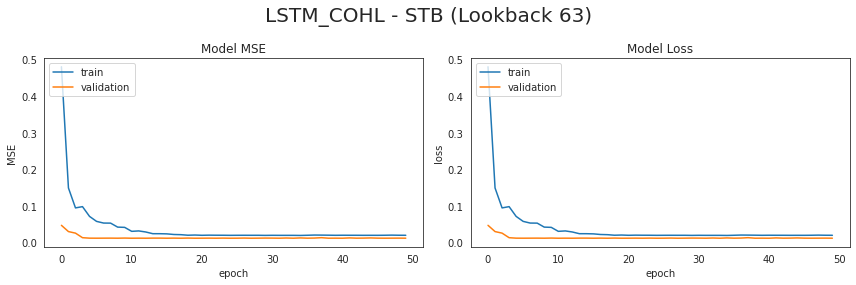

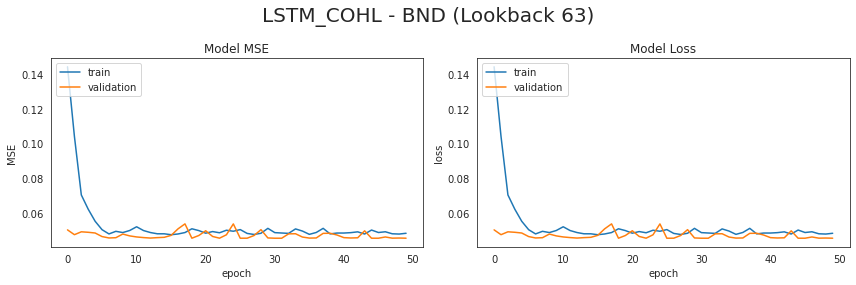

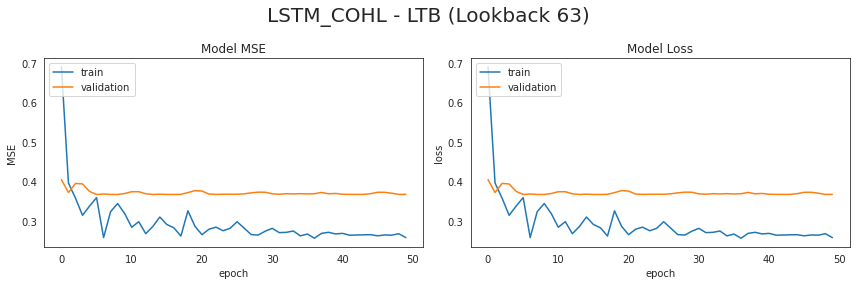

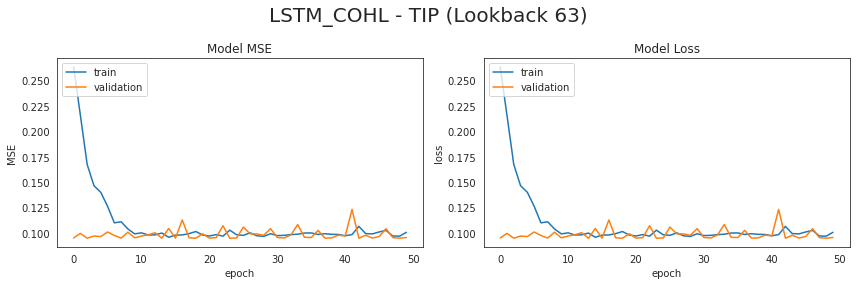

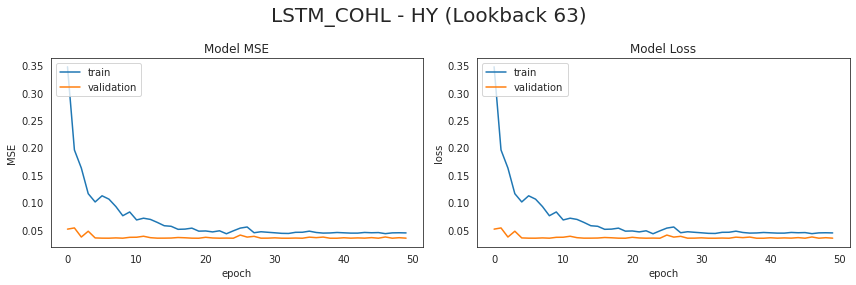

...

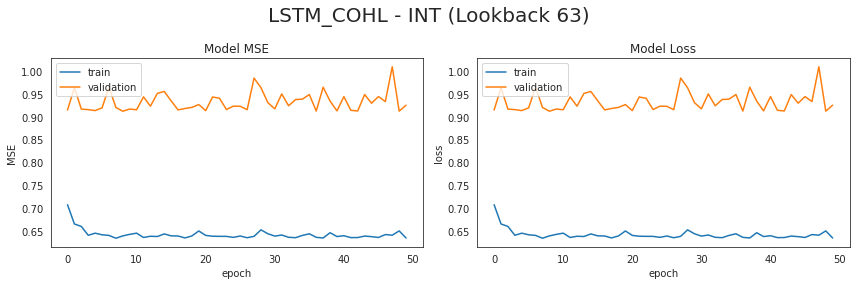

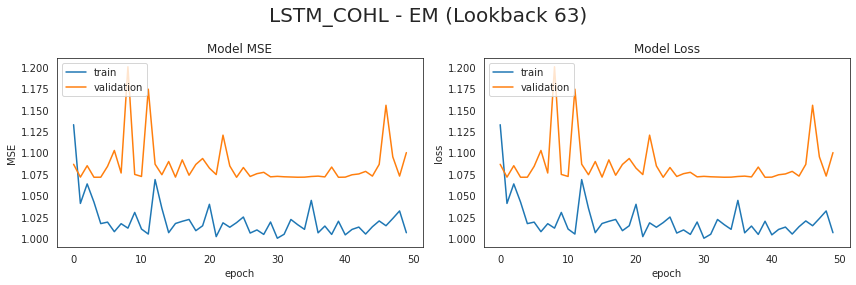

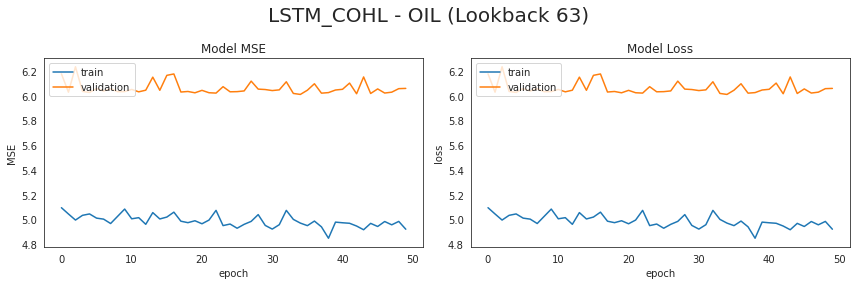

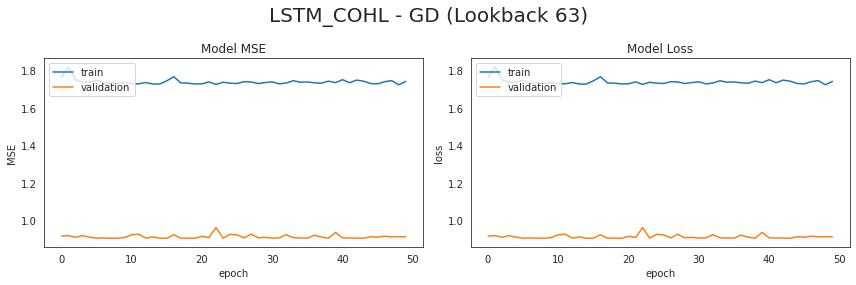

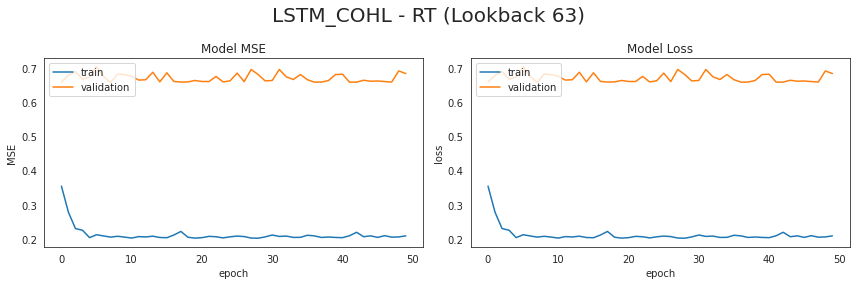

In [ ]:
"""
Identical process as above was used to choose these parameters. I found that this architecture led it to 
benefit from a few more iterations. The only new parameter is RETURN, which indicates whether we want to
use just the four price values, or the four price values AND the return data, to predict the future return.
I found that the model actually performed slightly better if we didn't include the return data.
"""
LOOKBACK = 21
UNITS = 50
LAYERS = 1
DROPOUT = True
LEARNING_RATE = 1e-2
DROPOUT_RATE = .2
VALIDATION_SPLIT = .3
EPOCHS = 50
RETURN = True

method = 'LSTM_COHL'
lookback = 63
# Iterate through all asset classes one by one

df_pred = pd.DataFrame(columns=ls_ticker)
df_sum = pd.DataFrame(columns=ls_ticker, index=['mse_train', 'mse_test', 'r2_train', 'r2_test'])

# Iterate through all asset classes one by one
for ticker in ls_ticker:
    print('~~~Ticker: %s' % (ticker))
    
    # fetch train and test data for this particular ticker
    df_temp = df_clean.loc[df_clean['ticker'] == ticker].reset_index(drop=True)
    df_train = df_temp.loc[df_temp['date'] <= date_split]
    df_test = df_temp.loc[df_temp.index >= df_temp[df_temp['date'] > date_split].index.min() - LOOKBACK - 1]
    
    # Reshape data into overlapping 21 week windows, into 21x4 or 21x5 tensors, depending on if we are using the return data
    X_train, y_train = df_clean_into_cohl(df_train, ticker, LOOKBACK, RETURN)
    X_test, y_test = df_clean_into_cohl(df_test, ticker, LOOKBACK, RETURN)
    
    # Transform data to LSTM node desired input shape, based on whether we are including the return data
    dim = 5 if RETURN else 4
    input_shape = (X_train.shape[1], dim)
    
    # Build LSTM model with current speficications
    model, history = build_LSTM(X_train, y_train, input_shape, num_units=UNITS, num_layers = LAYERS,
                                is_dropout = DROPOUT, learning_rate = LEARNING_RATE, dropout_rate = DROPOUT_RATE, 
                                validation_split = VALIDATION_SPLIT, epochs = EPOCHS)
    # summarize model output
    dc_sum, y_pred = summarize_model_output(model, X_train, X_test, y_train, y_test)

    # history plot
    plot_loss(history, ticker, method, lookback)
    df_pred[ticker] = y_pred
    df_sum[ticker] = dc_sum.values()

df_pred['date'] = df_test['date'][LOOKBACK + 1:].values

dc_model['%s_%d' % (method, lookback)] = {'sum': df_sum, 'pred': df_pred}

## Bi-LSTM with 1-day time step <div id='bi_lstm_1'>

We further expanded the LSTM model by introducing Bi-directional LSTMs. The input data is reshaped based on the time step, for example, Bi-LSTM with 1 day / 4 values will be reshaped into (input data length, 4, input data width) -> (row number, 4, column number). 

In [ ]:
def create_dataset(data_in, target_in):

    ragged_input  = tf.ragged.constant(data_in, dtype=tf.float64)
    ragged_target = tf.ragged.constant(target_in, tf.float64)

    dataset = tf.data.Dataset.from_tensor_slices((data_in, target_in))
    dataset = dataset.shuffle(200)
    dataset = dataset.batch(64)

                          
    dataset = dataset.prefetch(1)
    return dataset

~~~Ticker: STB
   ~~~Train/Test MSE: 0.0600/0.0446
   ~~~Train/Test R2: -0.0017/-0.0459
~~~Ticker: BND
   ~~~Train/Test MSE: 0.2102/0.1868
   ~~~Train/Test R2: -0.0000/-0.0249
~~~Ticker: LTB
   ~~~Train/Test MSE: 1.3403/2.5863
   ~~~Train/Test R2: -0.0001/-0.0002
~~~Ticker: TIP
   ~~~Train/Test MSE: 0.3460/0.3952
   ~~~Train/Test R2: -0.0066/-0.0020
~~~Ticker: HY
   ~~~Train/Test MSE: 0.2890/0.4291
   ~~~Train/Test R2: -0.0011/-0.0113
~~~Ticker: EB
   ~~~Train/Test MSE: 0.9692/0.7006
   ~~~Train/Test R2: -0.0014/-0.0232
~~~Ticker: LRG
   ~~~Train/Test MSE: 3.4077/3.3183
   ~~~Train/Test R2: -0.0011/-0.0053
~~~Ticker: VAL
   ~~~Train/Test MSE: 2.8411/3.2771
   ~~~Train/Test R2: -0.0000/-0.0006
~~~Ticker: GRO
   ~~~Train/Test MSE: 3.9791/3.8754
   ~~~Train/Test R2: -0.0009/-0.0106
~~~Ticker: MID
   ~~~Train/Test MSE: 4.0800/4.6423
   ~~~Train/Test R2: -0.0002/-0.0008
~~~Ticker: SML
   ~~~Train/Test MSE: 4.1707/5.6151
   ~~~Train/Test R2: -0.0000/-0.0003
~~~Ticker: INT
   ~~~Train/Test MS

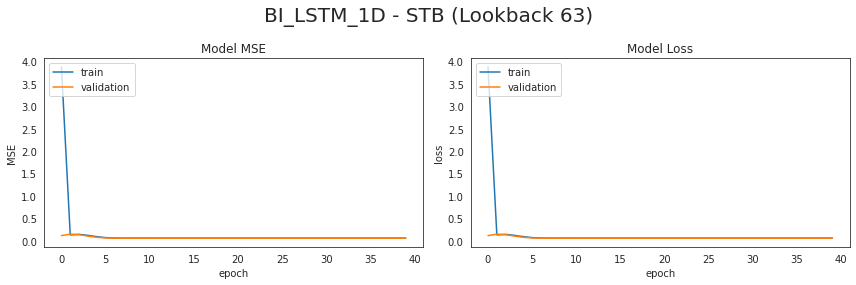

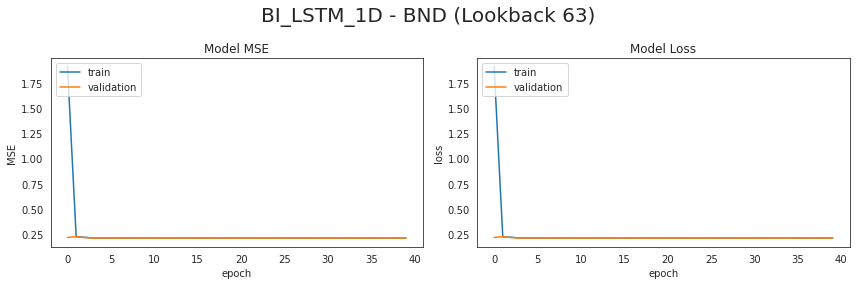

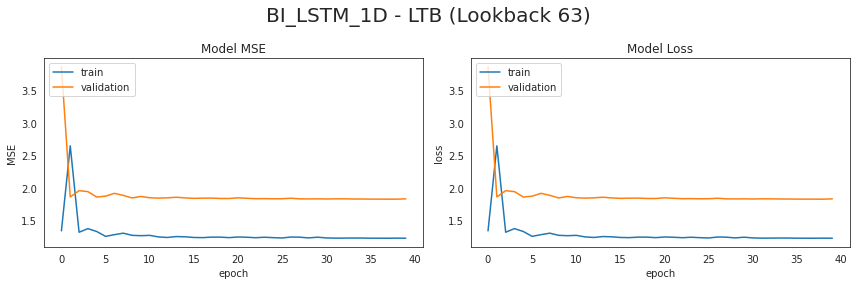

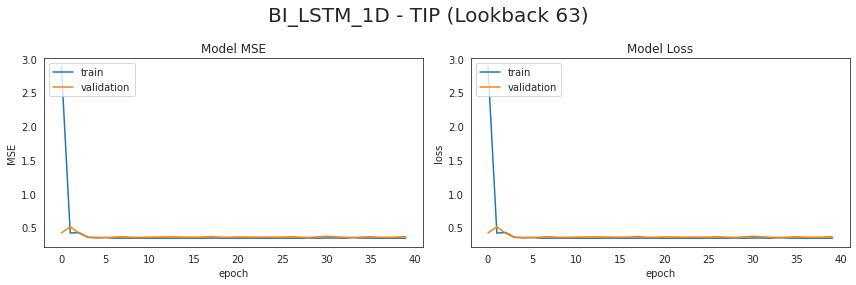

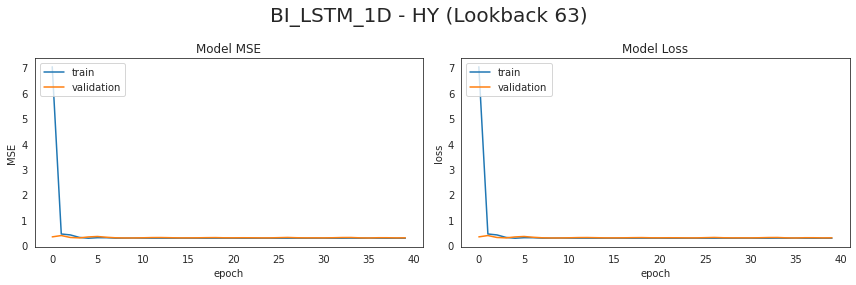

...

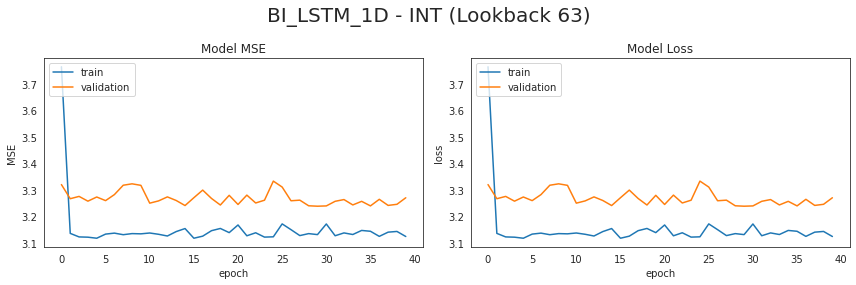

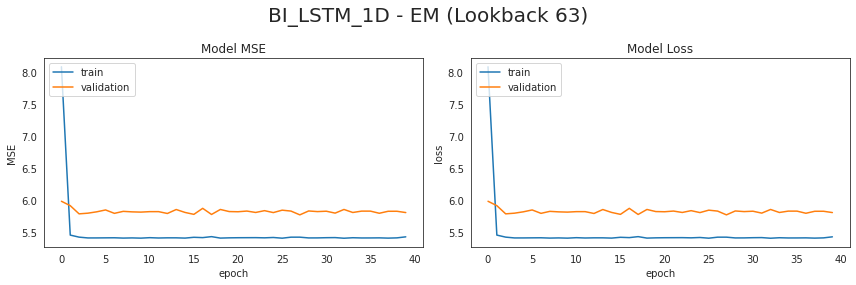

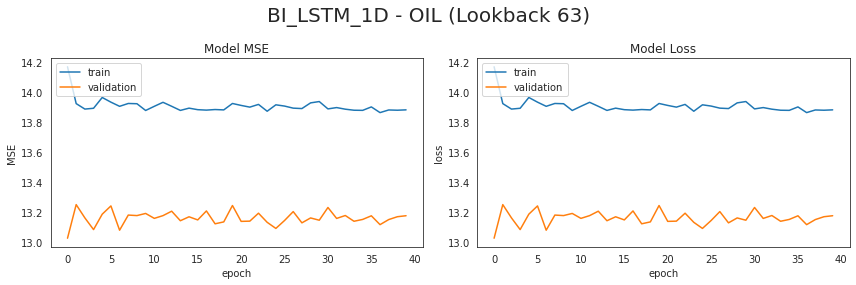

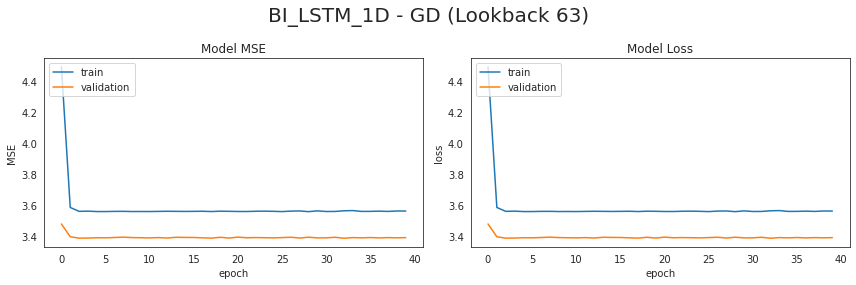

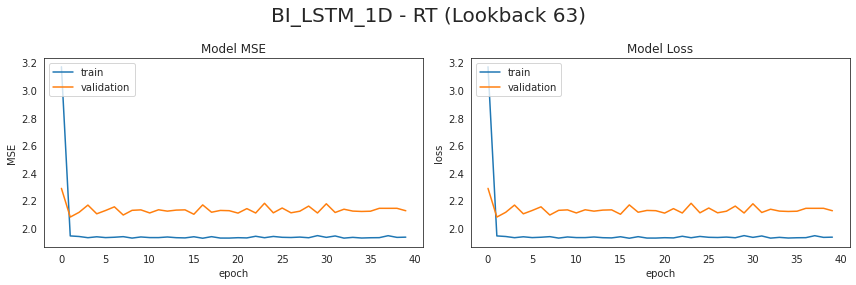

In [ ]:
method = 'BI_LSTM_1D'
lookback = 63
ls_x = [pred + str(lag) for lag in range(lookback - 1, -1, -1) for pred in ls_pred]

df_pred = pd.DataFrame(columns=ls_ticker)
df_sum = pd.DataFrame(columns=ls_ticker, index=['mse_train', 'mse_test', 'r2_train', 'r2_test'])

# Iterate through all asset classes one by one
for ticker in ls_ticker:
    print('~~~Ticker: %s' % (ticker))
    # select ticker
    mask = df_clean['ticker'] == ticker
    df_sample =  df_clean[mask].copy().reset_index(drop=True)
    
    # split between train and test
    df_train = df_sample.loc[df_sample['date'] <= date_split, 
                                 ls_x + ['response', 'response_win', 'date', 'ticker']].reset_index(drop=True)
    df_test = df_sample.loc[df_sample['date'] > date_split, 
                                ls_x + ['response', 'response_win', 'date', 'ticker']].reset_index(drop=True)
    
    # create X and y
    X_train = df_train[ls_x]
    X_test = df_test[ls_x]
    y_train = df_train['response_win']
    y_test = df_test['response_win']
    
    validation_percent = 0.20

    train_x, validate_x, train_y, validate_y  = train_test_split(X_train,y_train,
                                 test_size=validation_percent,
                                 random_state=108, shuffle=True)
    
    reshape_train_x = np.reshape(np.array(train_x.values.tolist()), (train_x.shape[0],4,int(train_x.shape[1]/4)))
    reshape_validate_x = np.reshape(np.array(validate_x.values.tolist()), (validate_x.shape[0],4,int(validate_x.shape[1]/4)))

    dataset_train = create_dataset(reshape_train_x, train_y)
    dataset_val  = create_dataset(reshape_validate_x, validate_y)
    
    # please put your model here
    tf.keras.backend.clear_session()
    
    model_daily_bi = Sequential()

    model_daily_bi.add(Bidirectional(LSTM(20, return_sequences=True, dropout = 0.1), 
                                      input_shape=(4, int(252/4)))) 
    model_daily_bi.add(TimeDistributed(Dense(1, activation='linear')))

    model_daily_bi.compile(loss='mse', 
                         optimizer=tf.keras.optimizers.Adam(learning_rate=0.05), 
                         metrics='mse')

    history_daily_bi= model_daily_bi.fit(dataset_train, 
                                 validation_data=dataset_val, 
                                 epochs=40,
                                verbose=0)
    
    # Predict the response variable for the test set using the trained model
    reshape_X_train = np.reshape(np.array(X_train.values.tolist()), (X_train.shape[0],4,int(X_train.shape[1]/4)))
    reshape_X_test = np.reshape(np.array(X_test.values.tolist()), (X_test.shape[0],4,int(X_test.shape[1]/4)))
    
    y_pred_train = model_daily_bi.predict(reshape_X_train)#.reshape(-1,)
    y_pred_test = model_daily_bi.predict(reshape_X_test)#.reshape(-1,)

    #the prediction is in block of 4 values, only take the first value. 
    # The predicted value is the next week's return
    y_pred_train = np.array(y_pred_train)[:,0]
    y_pred_test = np.array(y_pred_test)[:,0]
    
    # Compute the MSE for the test data
    MSE_train = mean_squared_error(y_train, y_pred_train)
    MSE_test = mean_squared_error(y_test, y_pred_test)

    r2_test = r2_score(y_test, y_pred_test)
    r2_train = r2_score(y_train, y_pred_train)
    
    print(f"   ~~~Train/Test MSE: {MSE_train:.4f}/{MSE_test:.4f}")
    print(f"   ~~~Train/Test R2: {r2_train:.4f}/{r2_test:.4f}")
    
    dc_sum = {'mse_train':  MSE_train, 
              'mse_test':   MSE_test, 
              'r2_train':   r2_train, 
              'r2_test':    r2_test}

    plot_loss(history_daily_bi, ticker, method, lookback)
    df_pred[ticker] = y_pred_test.reshape(-1, )
    df_sum[ticker] = dc_sum.values()

df_pred['date'] = df_test['date']

dc_model[method] = {'sum': df_sum, 'pred': df_pred}

## Bi-LSTM with 7-day time step <div id='bi_lstm_7'>
 Similar to the Bi-LSTM with time step =1 day, we also looked into the 7 day window impact on the return prediction. Usually for weekly price window selection, we choose 5 trading days or 7 calendar days, but the raw data we sourced in this project has 63 trading days in total, we can only use 1 / 3 / 7 / 21 /63 days as time steps in reshaping the input data to include all the values. 

~~~Ticker: STB
   ~~~Train/Test MSE: 0.0605/0.0436
   ~~~Train/Test R2: -0.0091/-0.0227
~~~Ticker: BND
   ~~~Train/Test MSE: 0.2162/0.1823
   ~~~Train/Test R2: -0.0286/-0.0003
~~~Ticker: LTB
   ~~~Train/Test MSE: 1.3406/2.5860
   ~~~Train/Test R2: -0.0003/-0.0001
~~~Ticker: TIP
   ~~~Train/Test MSE: 0.3443/0.4044
   ~~~Train/Test R2: -0.0017/-0.0254
~~~Ticker: HY
   ~~~Train/Test MSE: 0.2890/0.4291
   ~~~Train/Test R2: -0.0011/-0.0115
~~~Ticker: EB
   ~~~Train/Test MSE: 0.9681/0.6960
   ~~~Train/Test R2: -0.0003/-0.0166
~~~Ticker: LRG
   ~~~Train/Test MSE: 3.4065/3.3152
   ~~~Train/Test R2: -0.0007/-0.0044
~~~Ticker: VAL
   ~~~Train/Test MSE: 2.8434/3.2829
   ~~~Train/Test R2: -0.0008/-0.0024
~~~Ticker: GRO
   ~~~Train/Test MSE: 3.9760/3.8594
   ~~~Train/Test R2: -0.0001/-0.0065
~~~Ticker: MID
   ~~~Train/Test MSE: 4.0796/4.6411
   ~~~Train/Test R2: -0.0001/-0.0005
~~~Ticker: SML
   ~~~Train/Test MSE: 4.1709/5.6138
   ~~~Train/Test R2: -0.0001/-0.0000
~~~Ticker: INT
   ~~~Train/Test MS

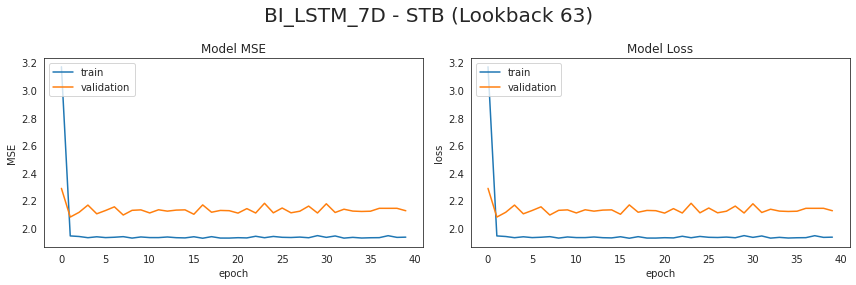

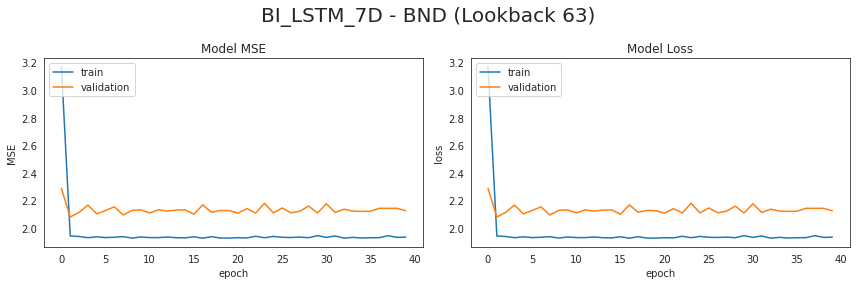

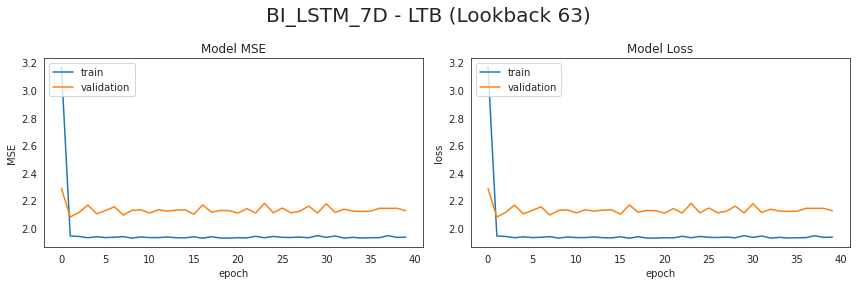

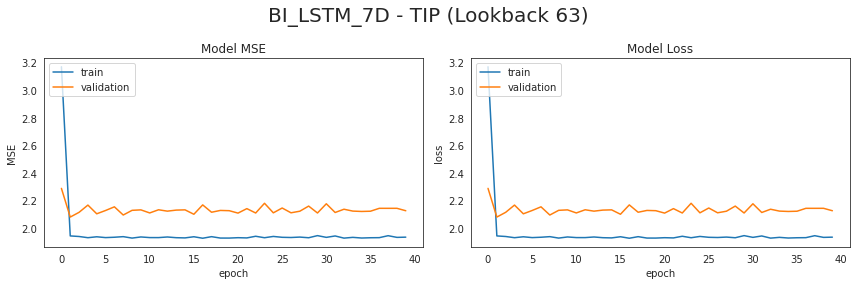

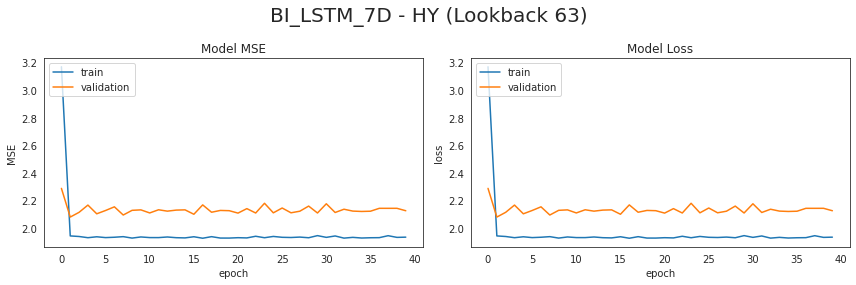

...

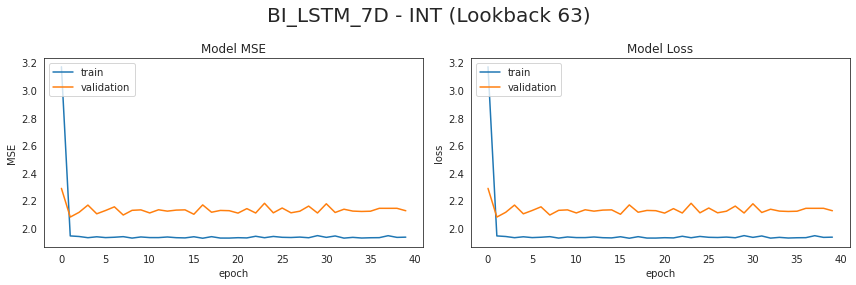

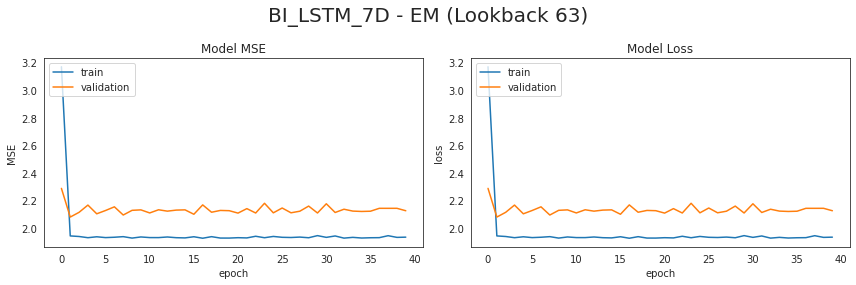

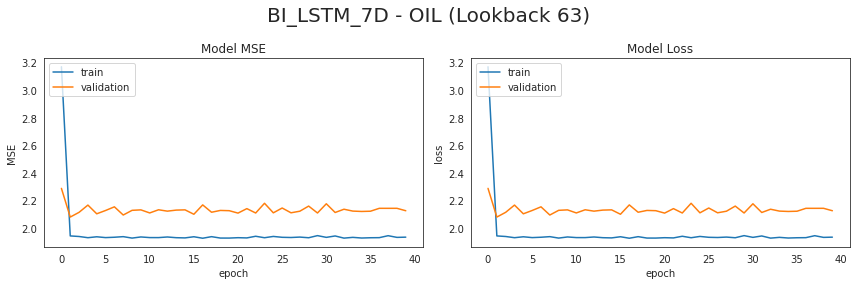

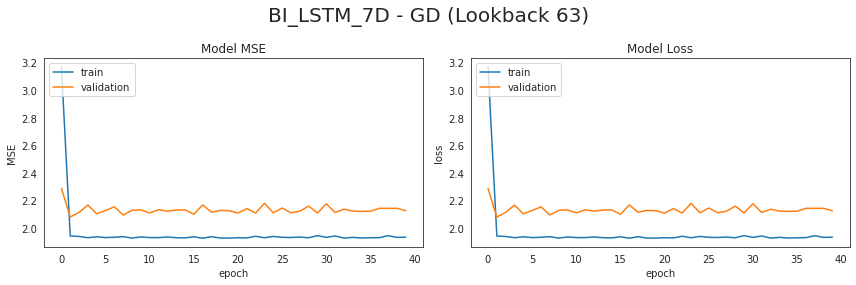

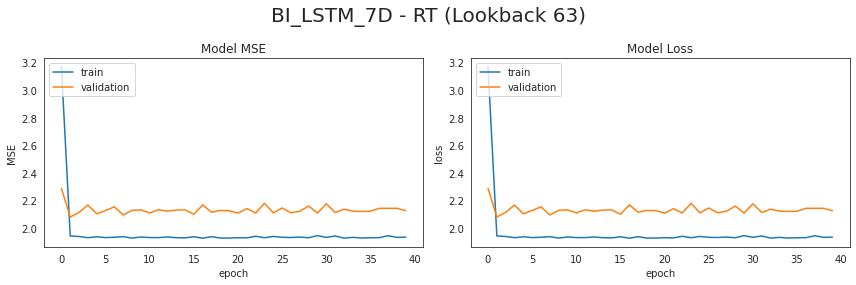

In [ ]:
method = 'BI_LSTM_7D'
lookback = 63
ls_x = [pred + str(lag) for lag in range(lookback - 1, -1, -1) for pred in ls_pred]

df_pred = pd.DataFrame(columns=ls_ticker)
df_sum = pd.DataFrame(columns=ls_ticker, index=['mse_train', 'mse_test', 'r2_train', 'r2_test'])

for ticker in ls_ticker:
    print('~~~Ticker: %s' % (ticker))
    # select ticker
    mask = df_clean['ticker'] == ticker
    df_sample =  df_clean[mask].copy().reset_index(drop=True)
    
    # split between train and test
    df_train = df_sample.loc[df_sample['date'] <= date_split, 
                                 ls_x + ['response', 'response_win', 'date', 'ticker']].reset_index(drop=True)
    df_test = df_sample.loc[df_sample['date'] > date_split, 
                                ls_x + ['response', 'response_win', 'date', 'ticker']].reset_index(drop=True)
    
    
    # create X and y
    X_train = df_train[ls_x]
    X_test = df_test[ls_x]
    y_train = df_train['response_win']
    y_test = df_test['response_win']
    
    validation_percent = 0.20

    train_x, validate_x, train_y, validate_y  = train_test_split(X_train,y_train,
                                 test_size=validation_percent,
                                 random_state=108, shuffle=True)

    reshape_train_x = np.reshape(np.array(train_x.values.tolist()), (train_x.shape[0],28,int(train_x.shape[1]/28)))
    reshape_validate_x = np.reshape(np.array(validate_x.values.tolist()), (validate_x.shape[0],28,int(validate_x.shape[1]/28)))

    dataset_train = create_dataset(reshape_train_x, train_y)
    dataset_val  = create_dataset(reshape_validate_x, validate_y)
    
    # please put your model here
    tf.keras.backend.clear_session()
    
    model_weekly_bi = Sequential()

    model_weekly_bi.add(Bidirectional(LSTM(20, return_sequences=True, dropout = 0.1), 
                                      input_shape=(28, int(252/28)))) 
    model_weekly_bi.add(TimeDistributed(Dense(1, activation='linear')))

    model_weekly_bi.compile(loss='mse', 
                         optimizer=tf.keras.optimizers.Adam(learning_rate=0.05), 
                         metrics='mse')

    history_weekly_bi= model_weekly_bi.fit(dataset_train, 
                                 validation_data=dataset_val, 
                                 epochs=40,
                                verbose=0)
    
    # Predict the response variable for the test set using the trained model
    reshape_X_train = np.reshape(np.array(X_train.values.tolist()), (X_train.shape[0],28,int(X_train.shape[1]/28)))
    reshape_X_test = np.reshape(np.array(X_test.values.tolist()), (X_test.shape[0],28,int(X_test.shape[1]/28)))
    
    y_pred_train = model_weekly_bi.predict(reshape_X_train)#.reshape(-1,)
    y_pred_test = model_weekly_bi.predict(reshape_X_test)#.reshape(-1,)

    #the prediction is in block of 28 values, only take the first value. 
    # The predicted value is the next week's return
    y_pred_train = np.array(y_pred_train)[:,0]
    y_pred_test = np.array(y_pred_test)[:,0]
    
    # Compute the MSE for the test data
    MSE_train = mean_squared_error(y_train, y_pred_train)
    MSE_test = mean_squared_error(y_test, y_pred_test)

    r2_test = r2_score(y_test, y_pred_test)
    r2_train = r2_score(y_train, y_pred_train)
        
    print(f"   ~~~Train/Test MSE: {MSE_train:.4f}/{MSE_test:.4f}")
    print(f"   ~~~Train/Test R2: {r2_train:.4f}/{r2_test:.4f}")
    
    dc_sum = {'mse_train':  MSE_train, 
              'mse_test':   MSE_test, 
              'r2_train':   r2_train, 
              'r2_test':    r2_test}

    plot_loss(history_daily_bi, ticker, method, lookback)
    df_pred[ticker] = y_pred_test.reshape(-1, )
    df_sum[ticker] = dc_sum.values()

df_pred['date'] = df_test['date']

dc_model[method] = {'sum': df_sum, 'pred': df_pred} 

## Bi-LSTM with 1/3/7/21-day time step <div id='bi_lstm_multi'>

We built a milti-period Bi-LSTM model to account for short, mid and long term price impact on the next week's returns. We reshape the input data 4 times, with time step = 1, 3, 7 and 21 days. The multi-period Bi-LSTM has 2 forward LSTM layers, 2 backward LSTM layers, and a final dense layer to produce 1 output through linear activation function for each time step input, and each output is assumed to be equally weighted at 0.25. The weights for the time factors can be adjusted as long as they sum up to 1, e.g., if the model developer believes near term price impact is larger than long dated price, the weight for 1-day time step input can increase to 0.4, and the weight for 21-day time step input will drop to 0.1 accordingly. 

~~~Ticker: STB
   ~~~Train/Test MSE: 0.0600/0.0446
   ~~~Train/Test R2: -0.0019/-0.0450
~~~Ticker: BND
   ~~~Train/Test MSE: 0.2104/0.1852
   ~~~Train/Test R2: -0.0012/-0.0160
~~~Ticker: LTB
   ~~~Train/Test MSE: 1.3402/2.5859
   ~~~Train/Test R2: -0.0000/-0.0001
~~~Ticker: TIP
   ~~~Train/Test MSE: 0.3440/0.3977
   ~~~Train/Test R2: -0.0009/-0.0085
~~~Ticker: HY
   ~~~Train/Test MSE: 0.2894/0.4303
   ~~~Train/Test R2: -0.0024/-0.0142
~~~Ticker: EB
   ~~~Train/Test MSE: 0.9699/0.7028
   ~~~Train/Test R2: -0.0022/-0.0265
~~~Ticker: LRG
   ~~~Train/Test MSE: 3.4083/3.3195
   ~~~Train/Test R2: -0.0012/-0.0057
~~~Ticker: VAL
   ~~~Train/Test MSE: 2.8411/3.2760
   ~~~Train/Test R2: -0.0000/-0.0003
~~~Ticker: GRO
   ~~~Train/Test MSE: 3.9761/3.8608
   ~~~Train/Test R2: -0.0001/-0.0068
~~~Ticker: MID
   ~~~Train/Test MSE: 4.0821/4.6392
   ~~~Train/Test R2: -0.0007/-0.0001
~~~Ticker: SML
   ~~~Train/Test MSE: 4.1709/5.6138
   ~~~Train/Test R2: -0.0001/-0.0000
~~~Ticker: INT
   ~~~Train/Test MS

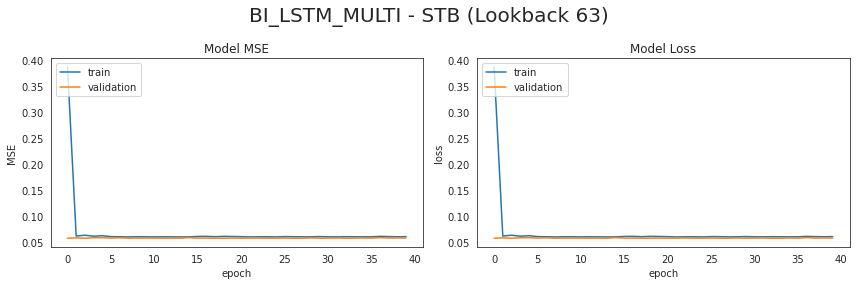

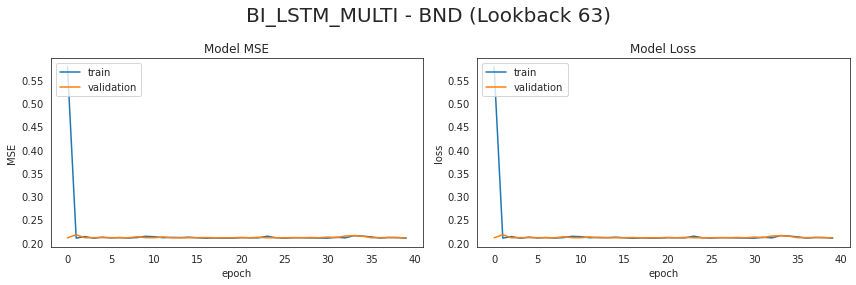

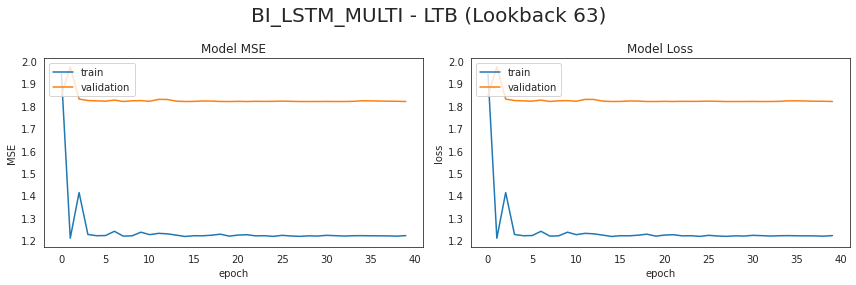

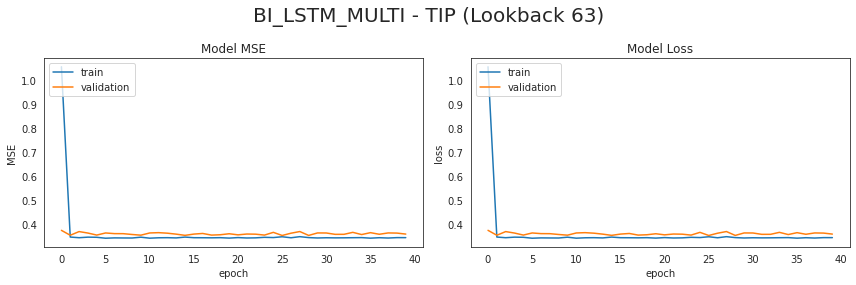

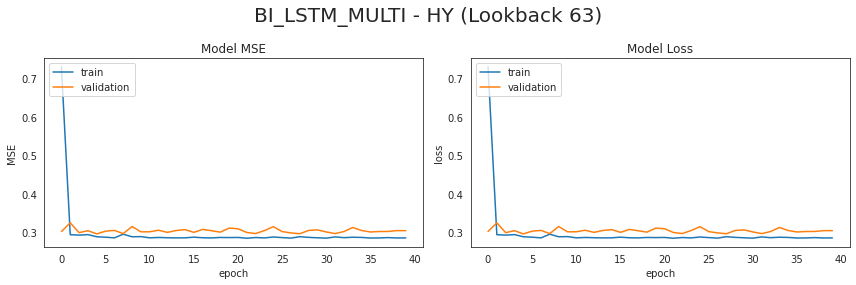

...

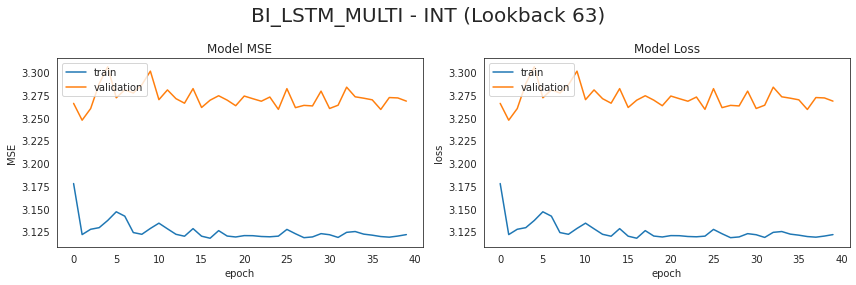

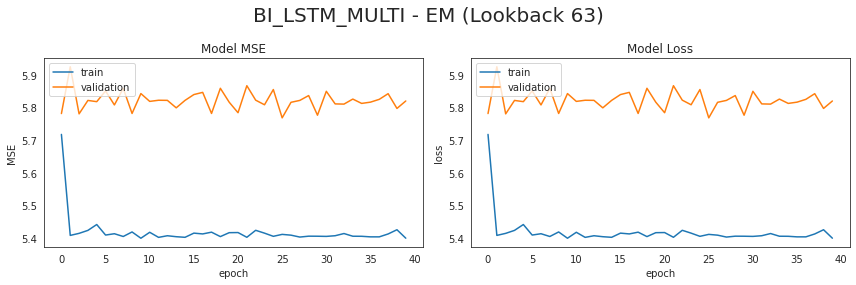

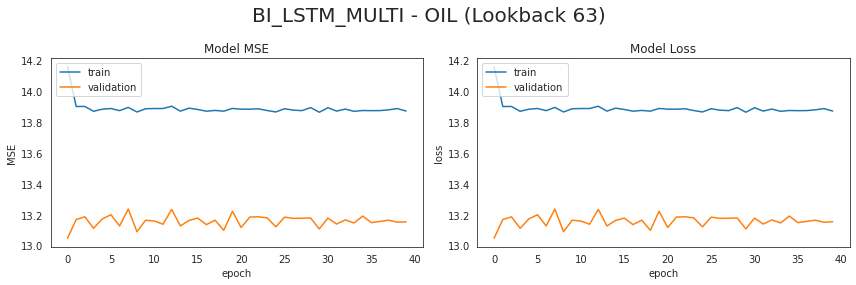

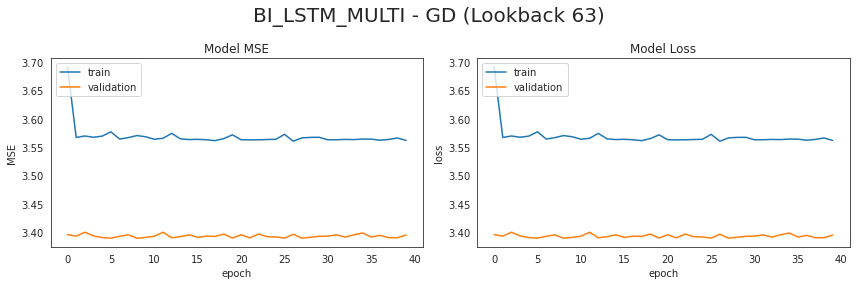

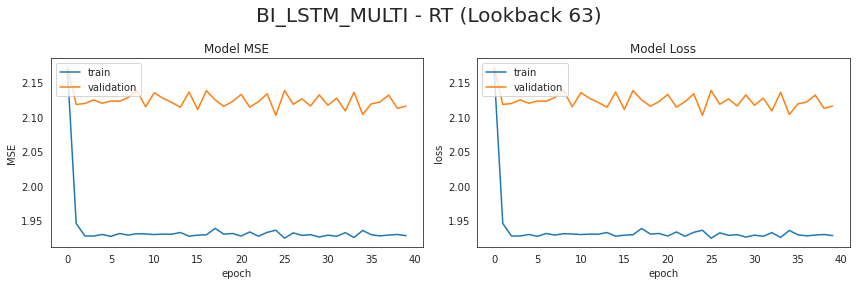

In [ ]:
method = 'BI_LSTM_MULTI'
lookback = 63
ls_x = [pred + str(lag) for lag in range(lookback - 1, -1, -1) for pred in ls_pred]

df_pred = pd.DataFrame(columns=ls_ticker)
df_sum = pd.DataFrame(columns=ls_ticker, index=['mse_train', 'mse_test', 'r2_train', 'r2_test'])

for ticker in ls_ticker:
    print('~~~Ticker: %s' % (ticker))
    # select ticker
    mask = df_clean['ticker'] == ticker
    df_sample =  df_clean[mask].copy().reset_index(drop=True)
    
    # split between train and test
    df_train = df_sample.loc[df_sample['date'] <= date_split, 
                                 ls_x + ['response', 'response_win', 'date', 'ticker']].reset_index(drop=True)
    df_test = df_sample.loc[df_sample['date'] > date_split, 
                                ls_x + ['response', 'response_win', 'date', 'ticker']].reset_index(drop=True)
    
    # create X and y
    X_train = df_train[ls_x]
    X_test = df_test[ls_x]
    y_train = df_train['response_win']
    y_test = df_test['response_win']
    
    validation_percent = 0.20

    train_x, validate_x, train_y, validate_y  = train_test_split(X_train,y_train,
                                 test_size=validation_percent,
                                 random_state=108, shuffle=True)
    
    #reshape the data for the n_time_step:
    reshape1_train_x = np.reshape(np.array(train_x.values.tolist()), (train_x.shape[0],4,int(train_x.shape[1]/4)))
    reshape1_validate_x = np.reshape(np.array(validate_x.values.tolist()), (validate_x.shape[0],4,int(validate_x.shape[1]/4)))

    
    reshape3_train_x = np.reshape(np.array(train_x.values.tolist()), (train_x.shape[0],12,int(train_x.shape[1]/12)))
    reshape3_validate_x = np.reshape(np.array(validate_x.values.tolist()), (validate_x.shape[0],12,int(validate_x.shape[1]/12)))


    reshape7_train_x = np.reshape(np.array(train_x.values.tolist()), (train_x.shape[0],28,int(train_x.shape[1]/28)))
    reshape7_validate_x = np.reshape(np.array(validate_x.values.tolist()), (validate_x.shape[0],28,int(validate_x.shape[1]/28)))


    reshape21_train_x = np.reshape(np.array(train_x.values.tolist()), (train_x.shape[0],84,int(train_x.shape[1]/84)))
    reshape21_validate_x = np.reshape(np.array(validate_x.values.tolist()), (validate_x.shape[0],84,int(validate_x.shape[1]/84)))

    # please put your model here
    tf.keras.backend.clear_session()
    seed = 10081008

    # Define the inputs for 1day(4 price values), 3days (12 price values), 
    #7days(28 price values) and 21days(84 price values)
    inputs_f_1 = tf.keras.Input(shape=(4, int(train_x.shape[1]/4),), dtype=tf.float64)
    inputs_f_3 = tf.keras.Input(shape=(12, int(train_x.shape[1]/12),), dtype=tf.float64)
    inputs_f_7 = tf.keras.Input(shape=(28, int(train_x.shape[1]/28),), dtype=tf.float64)
    inputs_f_21 = tf.keras.Input(shape=(84, int(train_x.shape[1]/84),), dtype=tf.float64)

    # Input of time step = 1, - Define the forward LSTMs
    RNN1_f_1 = tf.keras.layers.LSTM(40, return_sequences=True, go_backwards=False, dropout=0.2)
    h1_f_1 = RNN1_f_1(inputs_f_1)
    RNN1_f_7 = tf.keras.layers.LSTM(20, return_sequences=True, go_backwards=False,dropout=0.1)
    h1_f_7 = RNN1_f_7(h1_f_1)

    # Define the backwards LSTMs
    RNN1_b_1 = tf.keras.layers.LSTM(40, return_sequences=True, go_backwards=True, dropout=0.2)
    h1_b_1 = RNN1_b_1(h1_f_7)
    RNN1_b_7 = tf.keras.layers.LSTM(20, return_sequences=True, go_backwards=True, dropout=0.1)
    h1_b_7 = RNN1_b_7(h1_b_1)

    # Input of time step = 3, - Define the forward LSTMs
    RNN2_f_1 = tf.keras.layers.LSTM(40, return_sequences=True, go_backwards=False)
    h2_f_1 = RNN2_f_1(inputs_f_3)
    RNN2_f_7 = tf.keras.layers.LSTM(20, return_sequences=True, go_backwards=False)
    h2_f_7 = RNN2_f_7(h2_f_1)

    # Define the backwards LSTMs
    RNN2_b_1 = tf.keras.layers.LSTM(40, return_sequences=True, go_backwards=True)
    h2_b_1 = RNN2_b_1(h2_f_7)
    RNN2_b_7 = tf.keras.layers.LSTM(20, return_sequences=True, go_backwards=True)
    h2_b_7 = RNN2_b_7(h2_b_1)

    # Input of time step = 7, - Define the forward LSTMs
    RNN3_f_1 = tf.keras.layers.LSTM(40, return_sequences=True, go_backwards=False, dropout=0.2)
    h3_f_1 = RNN3_f_1(inputs_f_7)
    RNN3_f_7 = tf.keras.layers.LSTM(20, return_sequences=True, go_backwards=False,dropout=0.1)
    h3_f_7 = RNN3_f_7(h3_f_1)

    # Define the backwards LSTMs
    RNN3_b_1 = tf.keras.layers.LSTM(40, return_sequences=True, go_backwards=True)
    h3_b_1 = RNN3_b_1(h3_f_7)
    RNN3_b_7 = tf.keras.layers.LSTM(20, return_sequences=True, go_backwards=True)
    h3_b_7 = RNN3_b_7(h3_b_1)

    # Input of time step = 21,  - Define the forward LSTMs
    RNN4_f_1 = tf.keras.layers.LSTM(40, return_sequences=True, go_backwards=False)
    h4_f_1 = RNN4_f_1(inputs_f_21)
    RNN4_f_7 = tf.keras.layers.LSTM(20, return_sequences=True, go_backwards=False)
    h4_f_7 = RNN4_f_7(h4_f_1)

    # Define the backwards LSTMs
    RNN4_b_1 = tf.keras.layers.LSTM(40, return_sequences=True, go_backwards=True)
    h4_b_1 = RNN4_b_1(h4_f_7)
    RNN4_b_7 = tf.keras.layers.LSTM(20, return_sequences=True, go_backwards=True)
    h4_b_7 = RNN4_b_7(h4_b_1)


    # Add a dense layer for prediction 
    Dense = tf.keras.layers.Dense(1, activation='linear')

    pred1 = tf.reduce_mean(Dense(h1_b_7),1)
    pred2 = tf.reduce_mean(Dense(h2_b_7),1)
    pred3 = tf.reduce_mean(Dense(h3_b_7),1)
    pred4 = tf.reduce_mean(Dense(h4_b_7),1)

    #define your own weights for the time factors as long as they sum up to 1
    pred_final = 0.25*pred1 + 0.25*pred2 + 0.25*pred3 + 0.25*pred4 
    
    model_multi_bi = tf.keras.Model(inputs=(inputs_f_1, inputs_f_3, inputs_f_7, inputs_f_21), 
                                outputs = pred_final )

    model_multi_bi.compile(loss='mse', 
                        optimizer= tf.keras.optimizers.Adam(learning_rate=0.05), 
                        metrics='mse')
    
    multi_bi_train = create_dataset((reshape1_train_x, reshape3_train_x,reshape7_train_x,
                                           reshape21_train_x), train_y)

    multi_bi_val = create_dataset((reshape1_validate_x, reshape3_validate_x,reshape7_validate_x,
                                                   reshape21_validate_x), 
                                                  validate_y)
    
    history_model_multi_bi= model_multi_bi.fit(multi_bi_train,
                                 validation_data=multi_bi_val, 
                                                  epochs=40, verbose=0)
    
    # Predict the response variable for the test set using the trained model
    reshape_X_train_1 = np.reshape(np.array(X_train.values.tolist()), (X_train.shape[0],4,int(X_train.shape[1]/4)))
    reshape_X_test_1 = np.reshape(np.array(X_test.values.tolist()), (X_test.shape[0],4,int(X_test.shape[1]/4)))
    
    reshape_X_train_3 = np.reshape(np.array(X_train.values.tolist()), (X_train.shape[0],12,int(X_train.shape[1]/12)))
    reshape_X_test_3 = np.reshape(np.array(X_test.values.tolist()), (X_test.shape[0],12,int(X_test.shape[1]/12)))
    
    reshape_X_train_7 = np.reshape(np.array(X_train.values.tolist()), (X_train.shape[0],28,int(X_train.shape[1]/28)))
    reshape_X_test_7 = np.reshape(np.array(X_test.values.tolist()), (X_test.shape[0],28,int(X_test.shape[1]/28)))
    
    reshape_X_train_21 = np.reshape(np.array(X_train.values.tolist()), (X_train.shape[0],84,int(X_train.shape[1]/84)))
    reshape_X_test_21 = np.reshape(np.array(X_test.values.tolist()), (X_test.shape[0],84,int(X_test.shape[1]/84)))
    
    
    y_pred_train = model_multi_bi.predict((reshape_X_train_1, reshape_X_train_3,
                                          reshape_X_train_7, reshape_X_train_21))
    y_pred_test = model_multi_bi.predict((reshape_X_test_1, reshape_X_test_3,
                                          reshape_X_test_7, reshape_X_test_21))
     
    #the prediction is in block of 4/12/28/84 values, only take the first value. 
    # The predicted value is the next week's return
    y_pred_train = np.array(y_pred_train)[:,0]
    y_pred_test = np.array(y_pred_test)[:,0]
    
    # Compute the MSE for the test data
    MSE_train = mean_squared_error(y_train, y_pred_train)
    MSE_test = mean_squared_error(y_test, y_pred_test)

    r2_test = r2_score(y_test, y_pred_test)
    r2_train = r2_score(y_train, y_pred_train)
    
    print(f"   ~~~Train/Test MSE: {MSE_train:.4f}/{MSE_test:.4f}")
    print(f"   ~~~Train/Test R2: {r2_train:.4f}/{r2_test:.4f}")
    
    dc_sum = {'mse_train':  MSE_train, 
              'mse_test':   MSE_test, 
              'r2_train':   r2_train, 
              'r2_test':    r2_test}

    plot_loss(history_model_multi_bi, ticker, method, lookback)
    df_pred[ticker] = y_pred_test.reshape(-1, )
    df_sum[ticker] = dc_sum.values()

df_pred['date'] = df_test['date']

dc_model[method] = {'sum': df_sum, 'pred': df_pred} 

In [ ]:
if not os.path.exists(pkl_model):
    with open(pkl_model, 'wb') as p:
        pickle.dump(dc_model, p)
        p.close()
else:
    with open(pkl_model, 'rb') as p:
        dc_model = pickle.load(p)

# Model Comparison <div id='model_comp'>
 
Looking at model comparison by asset, one can see one directional LSTM model shows the lowest MSE across the board. It significantly outperforms the rest of the models regardless of whether we are using open/close/high/low prices. securities from equity and alternative classes show similar trend. One potential reason is that one-directional LSTM is able to offer sufficient linkage to past performance without introducing too much abundant information.

Looking across asset classes, fixed income securities seem to demonstrate different behaviors compared to equity and alternative. One possible reason could be due to the inherent low volatility nature of fixed income instruments.


In [ ]:
df_target['REV1'] = - df_target.groupby('ticker')['response'].shift(1)

## model comparison by asset <div id='model_comp_asset'>

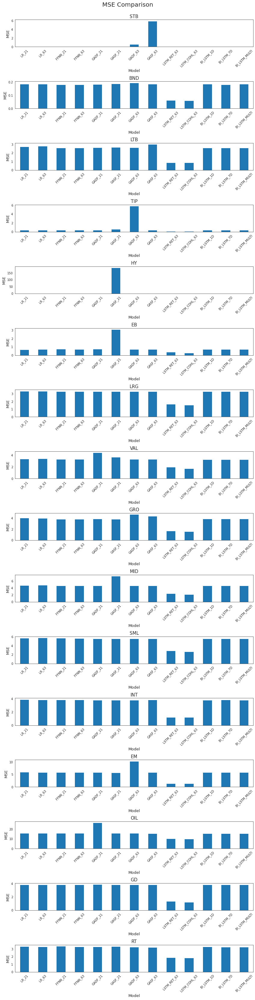

In [ ]:
dc_comp = {key: value for key, value in dc_model.items() if key not in ['MTF_21', 'MTF_63']}
# dc_comp = dc_model
ls_model = list(dc_comp.keys())

df_model, df_forecast = compile_model_result(dc_comp, is_plot=False)

sns.set_style('white')
fig, axs = plt.subplots(len(ls_ticker), 1, figsize=(12, 3 * len(ls_ticker)))
fig.suptitle('MSE Comparison', fontsize=20)

df_plot = df_model[df_model['item'] == 'mse_test'].reset_index(drop=True)

for ax, ticker in zip(axs, ls_ticker):
    df_plot.set_index('model')[ticker].plot.bar(ax=ax)
    
    ax.set_title(ticker, fontsize=15)
    ax.set_ylabel('MSE', fontsize=13)
    ax.set_xlabel('Model', fontsize=13)
    ax.tick_params(axis='x', rotation=45)

fig.tight_layout(rect=[0, 0.02, 1, 0.98])

## model comparison average <div id='model_comp_average'>

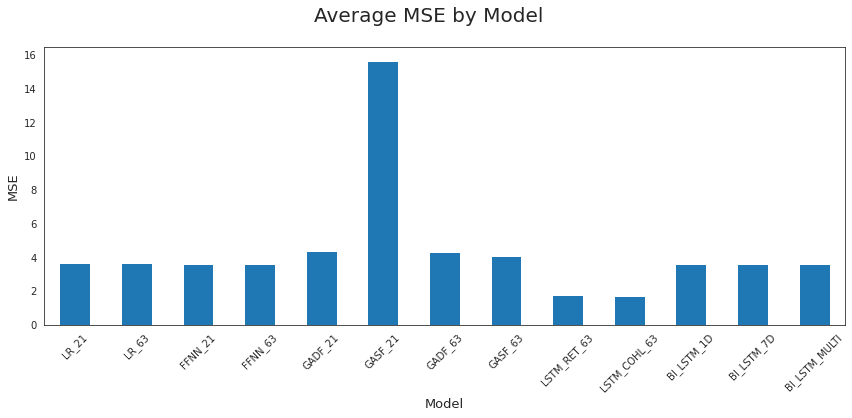

In [ ]:
sns.set_style('white')
fig, ax = plt.subplots(1, 1, figsize=(12, 6))
fig.suptitle('Average MSE by Model', fontsize=20)
df_plot.set_index('model')[ls_ticker].mean(axis=1).plot.bar(ax=ax)

ax.set_ylabel('MSE', fontsize=13)
ax.set_xlabel('Model', fontsize=13)
ax.tick_params(axis='x', rotation=45)

fig.tight_layout(rect=[0, 0.02, 1, 0.98])

# Backtest

Now, since the nature of the project is to predict forward returns in the financial market, it is very important to see if we can form profitable portfolios based on model predictions. Here for each model, we want to form equal weighted portfolio by longing the top half of predictions and shorting the bottoms. Also, we use short term reversal signal (REV_1) here as a benchmark given it is one the most commnonly seen technical metrics in the field.
- There is no significant alpha coming from linear regression and FFNN models. This further confirms our hypothesis that more complicated neural network models are needed in order to capture the fast varying nature of financial time series data.
- If we look at 21-day lookback window performance vs that of 63-day's within the same method, we can observe 21-day lookback window consistently outperforms. This could be due to shorter lookback window is more efficient in capturing the short term reversal effect which is commonly observed in financial market.
- LSTM model, although shows the best MSE in previous stage, does not form the best long-short portfolio. On the contrary GASF models give the highest returns across the board. In another word, good MSE performance does not always translate to good long-short performance in testing data. This could be due to the non-stationarity nature of finance time series data. The model that best fits the training data pattern won't necessarily fit the pattern in a live setting. Instead, we need something that can extracts patterns of data as well as observing structrual shifts in the market, which could be better done by CNN models by studying on the positional relationship between different market phenomenon.
- Statement above is further confirmed by looking at huge performance difference in 2020 covid crisis. Market timing become extremely important at such volatile periods. Therefore, CNN and bi-directional LSTM models which takes more positional information into account could outperform in such situations.

## create long short portfolio <div id='long_short'>

In [ ]:
ls_model = list(dc_comp.keys())

df_btst = df_forecast.copy()
df_btst = pd.melt(df_btst, id_vars=['date', 'model'], var_name='ticker', value_name='pred')
df_btst = pd.pivot(df_btst, index=['ticker', 'date'], columns='model', values='pred').rename_axis(columns=None)
df_btst = df_btst[ls_model].reset_index()
df_btst = pd.merge(df_target[df_target['date'] >= date_split], df_btst, on=['ticker', 'date'], how='left')

ls_model = ['REV1'] + list(dc_comp.keys())

In [ ]:
# equal weight portfolio 
df_btst['wt_bmk'] = 1

# form strategy and run backtest
strat = Strategy(id_col='ticker', date_col='date', bmk_col='wt_bmk', quantiles=2, factors=ls_model)
strat.run(df_btst)
bt = Backtest(strat, df_btst, 'response')
bt.run()

## performance summary <div id='perf_summary'>

In [ ]:
df_summary = bt.summary(baskets=[], long_short=True, extend=True)
df_summary.to_csv(csv_summary)
df_summary

factor,REV1,LR_21,LR_63,FFNN_21,FFNN_63,GADF_21,GASF_21,GADF_63,GASF_63,LSTM_RET_63,LSTM_COHL_63,BI_LSTM_1D,BI_LSTM_7D,BI_LSTM_MULTI
factor_basket,Q1-Q2,Q1-Q2,Q1-Q2,Q1-Q2,Q1-Q2,Q1-Q2,Q1-Q2,Q1-Q2,Q1-Q2,Q1-Q2,Q1-Q2,Q1-Q2,Q1-Q2,Q1-Q2
Alpha,-1.37%,-2.67%,-3.27%,-1.08%,-1.78%,4.81%,7.98%,-2.30%,5.45%,-3.35%,-4.54%,4.49%,4.49%,5.02%
Tracking_Error,18.79%,16.44%,16.38%,15.21%,15.23%,14.93%,16.05%,14.77%,17.67%,16.36%,15.78%,17.24%,17.24%,17.19%
IR,-0.07,-0.16,-0.20,-0.07,-0.12,0.32,0.50,-0.16,0.31,-0.20,-0.29,0.26,0.26,0.29
T_stat,-0.28,-0.61,-0.76,-0.27,-0.44,1.22,1.88,-0.59,1.17,-0.77,-1.09,0.98,0.99,1.10
IC,0.71%,1.20%,0.78%,1.89%,1.05%,2.07%,2.65%,3.43%,6.73%,2.44%,-1.28%,2.82%,4.33%,4.29%
Avg_Return,-1.37%,-2.67%,-3.27%,-1.08%,-1.78%,4.81%,7.98%,-2.30%,5.45%,-3.35%,-4.54%,4.49%,4.49%,5.02%
Avg_Vol,18.79%,16.44%,16.38%,15.21%,15.23%,14.93%,16.05%,14.77%,17.67%,16.36%,15.78%,17.24%,17.24%,17.19%
Consistency,50.27%,52.28%,50.94%,53.09%,53.09%,52.82%,56.72%,52.42%,54.70%,52.69%,50.00%,52.96%,52.96%,53.76%
Periods,744,744,744,744,744,744,744,744,744,744,744,744,744,744


## cumulative performance <div id='perf_cum'>

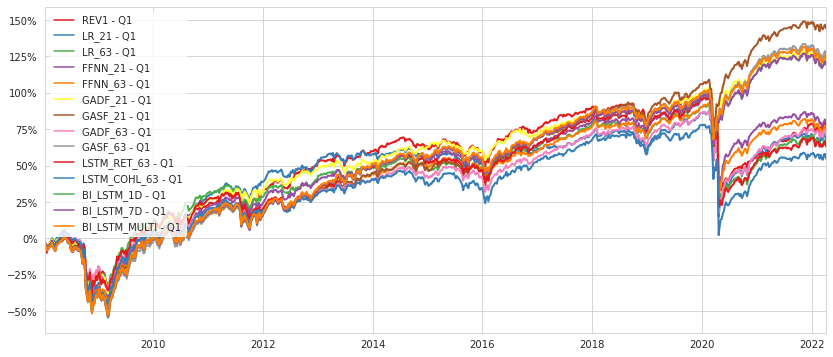

In [ ]:
# portfolio performance
cum_ret=bt.plot_performance(long_short=False, active=False)

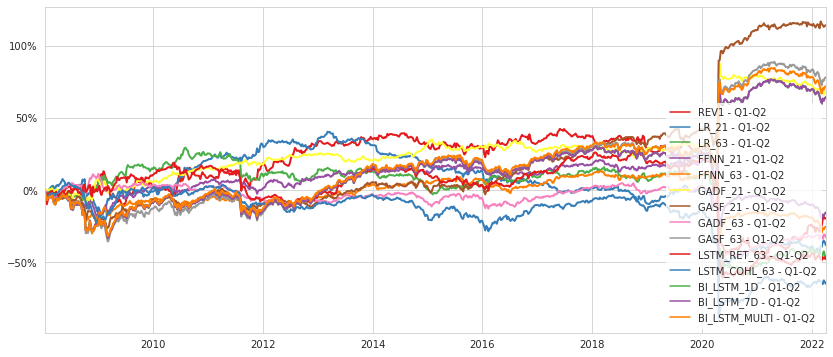

In [ ]:
# portfolio performance
cum_ret=bt.plot_performance(baskets=[], long_short=True, active=False)

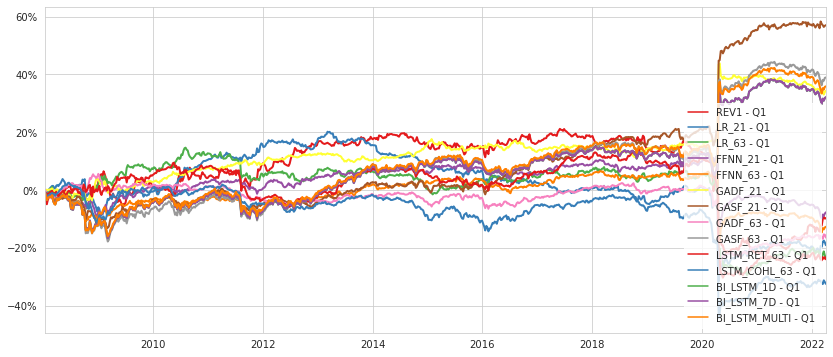

In [ ]:
# portfolio performance against benchmark i.e. equal weighted portfolio of all securities
cum_ret=bt.plot_performance(long_short=False, active=True)

## rolling performance <div id='perf_rolling'>

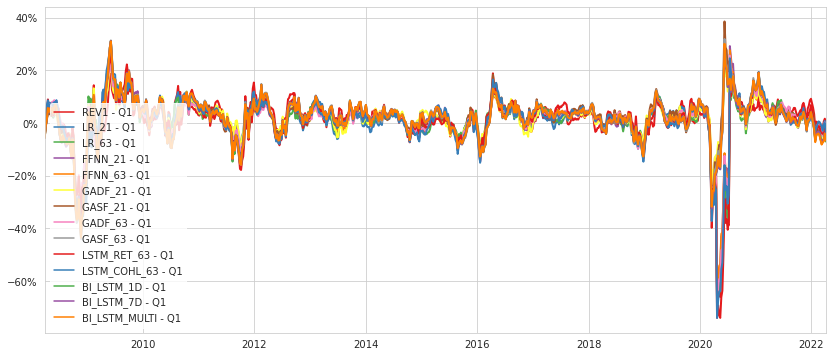

In [ ]:
# rolling performance
rets=bt.plot_rolling_performance(long_short=False)

# Conclusions

- Comparing within the same image transformation method in CNN, one can see 21-day lookback window outperforms 63-day as it captures short-term reversal more effectively.

- Bi-directional LSTM also works well in generating backtest returns given its advantage to extract sufficient amount of positional information to generalize in testing dataset. 

- GASF gives the best backtesting performance out of all model specs with good balance between risk and return. 
  - A large portion of the outperformance comes from 2020 covid crisis. 
  - Ability to extract past market patterns proves to be important in the presence of such black-swan events.

- As can be observed from several model specs, good MSE performance does not always generalize to good backtesting return
  - This could be due to the non-stationary nature of financial dataset therefore whatever worked in the past won't necessarily work in the future. We need to carefully tune our model and look at testing dataset performance to see each model's generalization ability.

## Next Steps
- Next we can try to test preferred specs on more sophisticated models.
  - AlexNet, GoogleNet
- Express data in traditional time series graph manner and run saliency analysis. Such graphs are more intuitive to understand and thus give us a better understanding of what’s driving the model

- Expand sample size by building the same model with stock-level (S&P500) data

- Can consider adjusting the model architecture for each asset class


**References:**

[1] Wang, Z., T. Oates. 2015. Encoding Time Series as Images for Visual Inspection and Classification
Using Tiled Convolutional Neural Networks, Trajectory-Based Behavior Analytics: Papers from the
2015 AAAI Workshop. 

[2] Jiang, J., Kelly, B., and Xiu, D. 2020. (Re-)Imag(in)ing Price Trends (December 1, 2020). Chicago Booth Research Paper No. 21-01